In [1]:
import sys, os
import numpy as np
import pandas as pd
from sklearn.metrics import r2_score, mean_squared_error
from scipy.stats import spearmanr, pearsonr
import seaborn as sns
import matplotlib.pyplot as plt
import random
import itertools
import warnings
from tqdm import tqdm
warnings.filterwarnings('ignore')

RESOLUTION = 25
window_size = 401

ALL_CELL_TYPES = ["T{0:0=2d}".format(x) for x in [1,2,3,4,5,6,7,8,9,10,11,12,13]]
assays = ['H3K36me3', 'H3K27me3', 'H3K27ac', 'H3K4me1', 'H3K4me3', 'H3K9me3', 'MNase']

In [2]:
colnames = ["pos_" + str(x) for x in list(range(-(window_size//2), (window_size//2) + 1))]
colnames = colnames + ["log10p1(TPM)", "cell_type", "chrom", "position", "strand", "assay_index"] 

# df = pd.read_csv('../../../Data/Original.Training_Data.csv.sorted', sep=",", names=colnames, low_memory=False)
df = pd.read_csv('../../../Data/Transformed.Training_Data.csv.sorted', sep=",", names=colnames, low_memory=False)

df

,pos_-200,pos_-199,pos_-198,pos_-197,pos_-196,pos_-195,pos_-194,pos_-193,pos_-192,pos_-191,...,pos_197,pos_198,pos_199,pos_200,log10p1(TPM),cell_type,chrom,position,strand,assay_index
0,0.404711,0.404711,0.404711,0.404711,0.404711,0.404711,0.404711,0.404711,0.404711,0.404711,...,0.404711,0.404711,0.404711,0.404711,0.0,T01,chr1,27466,-,2
1,0.352197,0.352197,0.352197,0.352197,0.352197,0.352197,0.352197,0.352197,0.352197,0.352197,...,0.352197,0.352197,0.352197,0.352197,0.0,T01,chr1,27466,-,3
2,0.345510,0.345510,0.345510,0.345510,0.345510,0.345510,0.345510,0.345510,0.345510,0.345510,...,0.345510,0.345510,0.345510,0.345510,0.0,T01,chr1,27466,-,4
3,0.342030,0.342030,0.342030,0.342030,0.342030,0.342030,0.342030,0.342030,0.342030,0.342030,...,0.342030,0.342030,0.342030,0.342030,0.0,T01,chr1,27466,-,5
4,0.351294,0.351294,0.351294,0.351294,0.351294,0.351294,0.351294,0.351294,0.351294,0.351294,...,0.351294,0.351294,0.351294,0.351294,0.0,T01,chr1,27466,-,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
828433,0.357446,0.412326,0.407789,0.398536,0.404581,0.324968,0.313034,0.313752,0.338428,0.356020,...,0.347971,0.348321,0.322026,0.332254,0.0,T13,chr22,2019474,+,3
828434,0.802335,1.133210,1.049832,1.049832,1.124592,1.226962,1.226962,1.442706,1.463740,1.378121,...,0.316077,0.316077,0.316077,0.316077,0.0,T13,chr22,2019474,+,4
828435,0.437168,0.358530,0.379583,0.379583,0.379583,0.379583,0.364877,0.437965,0.630581,0.567302,...,0.604903,0.509733,0.451201,0.489364,0.0,T13,chr22,2019474,+,5
828436,0.756888,0.813601,1.089862,1.102051,1.104208,1.061381,1.016406,0.747131,0.631313,0.512288,...,0.381220,0.381220,0.413746,0.453687,0.0,T13,chr22,2019474,+,6


NameError: name 'df' is not defined

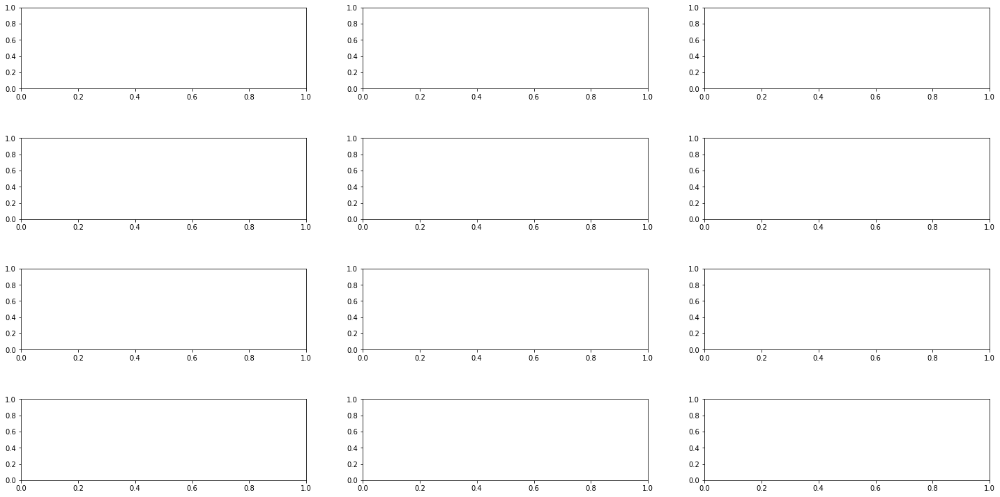

In [53]:
plt.rcParams["figure.figsize"] = (80, 20)
xticklabels = [RESOLUTION*x for x in range(-(window_size//2), (window_size//2)+1)]

Avocado_list = ["T11_A04", "T12_A07", "T13_A03"]

# Step-0: Subset dataframe to cell type and assay type
cell_types = ["T{0:0=2d}".format(x) for x in [2,3,4,5,6,7,8,9,10,11,12,13]]

cell_type_names = {'T01':'IMR-90', 
                   'T02':'H1-hESC', 
                   'T03':'trophoblast_cell', 
                   'T04':'neural_stem_progenitor_cell', 
                   'T05':'K562', 
                   'T06':'heart_left_ventricle',
                   'T07':'adrenal_gland',
                   'T08':'endocrine_pancreas',
                   'T09':'peripheral_blood_mononuclear_cell',
                   'T10':'amnion',
                   'T11':'myoepithelial_cell_of_mammary_gland',
                   'T12':'chorion',
                   'T13':'HEK293*'}

assay_type_ylim = {2:1.5, 3:1.6, 4:15, 5:1.8, 6:80, 7:0.7}

def convert_to_2D(idx, nrows, ncols):
    return idx//ncols, idx%ncols

for assay_type in range(2, 8):
    assay_name = "A{0:0=2d}".format(assay_type)
        
    num_rows = 4
    num_cols = 3
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 10), sharey=False)
    fig.tight_layout(pad=1, w_pad=5, h_pad=5)
    
    for idx, cell_type in enumerate(cell_types):
        
        if((cell_type+"_"+assay_name) in Avocado_list):
            Avocado_flag = " (A)"
        else:
            Avocado_flag = ""

        idx_x, idx_y = convert_to_2D(idx, nrows=num_rows, ncols=num_cols)
#         print(idx, idx_x, idx_y)
        ax = axes[idx_x, idx_y]
        
        df_analysis = df[(df["assay_index"] == assay_type) & (df["cell_type"] == cell_type)]

#         Step-1: Define gene expression quantiles
        number_of_quantiles = 5
        quantiles = [df_analysis["log10p1(TPM)"].quantile(x) for x in np.arange(0, 1, 1.0/(number_of_quantiles*1.0))]
#         print(quantiles)

        # Step-2: Group features by their quantile
        df_quantiles = {}
        for i in range(1, number_of_quantiles):
            df_quantiles[i] = df_analysis[(df_analysis["log10p1(TPM)"] >= quantiles[i-1]) & (df_analysis["log10p1(TPM)"] < quantiles[i])]

            # Step-3: Create sausage plot for each quantile within df_quantile
            y_values = np.expm1(df_quantiles[i].iloc[:, :window_size])
            y_corrected_values = y_values
            y_means = y_corrected_values.mean()
            y_stds = y_corrected_values.std()

            ax.plot(xticklabels, y_means, 
                     label=str(df_quantiles[i].shape[0])+" genes have TPM in ["+str(max(0.0, round(np.power(10, quantiles[i-1])-1,2)))+", "+
                            str(round(np.power(10, quantiles[i])-1,2))+")",
                            linewidth=2)
#             ax.fill_between(xticklabels,
# #         #                     range(-(window_size//2), (window_size//2)+1),
#                              df_quantiles[i].iloc[:, :window_size].mean()-df_quantiles[i].iloc[:, :window_size].std(), 
#                              df_quantiles[i].iloc[:, :window_size].mean()+df_quantiles[i].iloc[:, :window_size].std(),
#                              alpha=0.3)
        ax.set_title(str(cell_type_names[cell_type]) + Avocado_flag, fontsize=25)
#         ax.set_title(str(assays[assay_type-1]), fontsize=25)

        ax.set_xlim(-10000, 10000)
        ax.set_ylim(0, assay_type_ylim[assay_type])

        ax.tick_params(axis='both', which='major', labelsize=10)
        ax.tick_params(axis='both', which='minor', labelsize=10)
        ax.set_xlabel("Position (in bp) w.r.t TSS", size=15)
        ax.set_ylabel("-log10(p-value)", size=15)

    handles, labels = ax.get_legend_handles_labels()
#     fig.legend(handles, labels, loc='upper center', prop={'size': 10}, ncol=2)
    fig.suptitle(""+str(assays[assay_type-2]), fontsize=60,  y=1.12)
    plt.show()
#         plt.close()

In [4]:
# The p-value correction figure will come from the p-values_normalization notebook

In [5]:
# Now we discuss Figure 2, where we want to showcase a model that predicts gene expression from histone marks
# First we train 10 replicates each for linear and maxpool CNN models, on training chromosomes of all 13 cell types
# We then compute the spearman across all cell types as a function of input context length
import os 
sc_dict = {}
for model_type in ["linear", "maxpool"]:
    sc_dict[model_type] = []
    for context_length in range(31, 402, 10):
        sc_list = []
        for replicate in range(1, 11):
        
            num_layers = 3
            if( (context_length > 101) and (context_length <= 241) ):
                num_layers = 4
            elif(context_length >= 251):
                num_layers = 5
          
            if(context_length > 201):
                replicate = str(replicate) + ".all_cell_type"
        
            f_name = "../../../Logs/manuscript.R8.replicate_"+str(replicate)+"_0_transcriptome_"+str(context_length)+"_"+str(num_layers)+"_32_"+str(model_type)+"_mse_1.testing_metrics.tsv"
            
            if(os.path.exists(f_name)):         
                df_testing = pd.read_csv(f_name, sep="\t", header=None)
                sc = spearmanr(list(df_testing.iloc[:, 5]), list(df_testing.iloc[:, 6]))[0]
            else:
                sc = -100
                
            sc_list.append(sc)

        sc_dict[model_type].append((context_length, np.mean(sc_list), np.std(sc_list)))

sc_dict

{'linear': [(31, 0.6690299071906269, 0.00046024096480949976),
  (41, 0.6792023382269577, 0.00045156548442178753),
  (51, 0.682834208829177, 0.0009690157693024862),
  (61, 0.684578058346348, 0.0007366194776985587),
  (71, 0.6893575288676705, 0.000687985872190827),
  (81, 0.6902744989910012, 0.0007628435019214222),
  (91, 0.6917224273273724, 0.0007979905319446535),
  (101, 0.6937867274738241, 0.0011518211353132675),
  (111, 0.695737536895431, 0.0007903423405160085),
  (121, 0.6973862899871996, 0.0013349188153251761),
  (131, 0.6982009871978282, 0.0013807446422125702),
  (141, 0.7002088592759111, 0.0007736660595768267),
  (151, 0.701883006987103, 0.001147929761609922),
  (161, 0.7024593275443674, 0.0014973433545694482),
  (171, 0.7034213148890336, 0.0004972397278192912),
  (181, 0.7038035205193852, 0.0014847507840147732),
  (191, 0.7036159285648016, 0.0009842403719423497),
  (201, 0.7049467388378626, 0.001018215103973834),
  (211, 0.7060310241316051, 0.000807390120555083),
  (221, 0.70752

In [2]:
plt.rcParams["figure.figsize"] = (30, 10)
model_type_rename_dict = {"linear":"ridge", "maxpool":"cnn"}
colors = plt.cm.jet(np.linspace(0.1, 0.9, 2))
fill_colors = plt.cm.jet(np.linspace(0.15, 0.85, 2))
for i, model_type in enumerate(["maxpool", "linear"]):
    y_means = [x[1] for x in sc_dict[model_type]]
    y_lower = [x[1] - x[2] for x in sc_dict[model_type]]
    y_upper = [x[1] + x[2] for x in sc_dict[model_type]]
    
    plt.plot([25*x for x in list(range(31, 402, 10))], y_means, 'o-', color=colors[i], markersize=10, linewidth=5, label=model_type_rename_dict[model_type])
    plt.fill_between([25*x for x in list(range(31, 402, 10))], y_lower, y_upper, color=fill_colors[i], alpha = 0.2)
    plt.xlim(500, 10500)
    plt.ylim(0.66, 0.76)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.xlabel("Context length in bp", fontsize=35)
    plt.ylabel("Spearman correlation", fontsize=35)

plt.title("Spearman correlation on genes of test chromosomes\ncombined across all cell types", fontsize=40)
plt.legend(loc="lower center", fontsize=40)
plt.show()
plt.close()

NameError: name 'sc_dict' is not defined

In [7]:
# Now we pick the model with the longest context size (401 = 10Kb = 5Kb on either side of TSS)
# and train 10 replicates for linear and maxpool models
# We train on training chromosomes of all but one cell types and test on the remaining cell type
import seaborn as sns

sd_dict = {}
ct_sc_dict = {}
results_list = []
for cell_type_index in range(len(ALL_CELL_TYPES)):
    cell_type = ALL_CELL_TYPES[cell_type_index]
    ct_sc_dict[cell_type] = {}    
    for model_type in ["maxpool", "linear"]:
        ct_sc_dict[cell_type][model_type] = []

        for replicate in range(1, 11):
            yTrue = []
            yPred = []

            f_name = "../../../Logs/manuscript.R10.leave_one_out_cell_type_training.replicate_"+str(replicate)+"_0_transcriptome_401_5_32_"+model_type+"_mse_1_"+str(cell_type_index)+".testing_metrics.tsv"
            f_results = open(f_name, 'r')
            for line in f_results:
                vec = line.rstrip("\n").split("\t")
                if(vec[3] != cell_type):
                    continue
                else:
                    yTrue.append(float(vec[5]))
                    yPred.append(float(vec[6]))
            f_results.close()
            sc = np.nan_to_num(spearmanr(yTrue, yPred)[0])
            ct_sc_dict[cell_type][model_type].append(sc)

        results_list.append((cell_type_names[cell_type],
                             model_type_rename_dict[model_type],
                             np.mean(ct_sc_dict[cell_type][model_type]),
                             np.std(ct_sc_dict[cell_type][model_type])))
        
        sd_dict[np.mean(ct_sc_dict[cell_type][model_type])] = np.std(ct_sc_dict[cell_type][model_type])

# ct_sc_dict
# results_list
df_results = pd.DataFrame(results_list, columns=["cell_type", "model", "spearman_mean", "spearman_std"])
df_results

,cell_type,model,spearman_mean,spearman_std
0,IMR-90,cnn,0.757277,0.005886
1,IMR-90,ridge,0.728393,0.001238
2,H1-hESC,cnn,0.679273,0.003019
3,H1-hESC,ridge,0.653406,0.002621
4,trophoblast_cell,cnn,0.743651,0.008337
5,trophoblast_cell,ridge,0.722843,0.001520
6,neural_stem_progenitor_cell,cnn,0.733774,0.024052
7,neural_stem_progenitor_cell,ridge,0.730600,0.002133
8,K562,cnn,0.743879,0.005815
9,K562,ridge,0.711087,0.002243


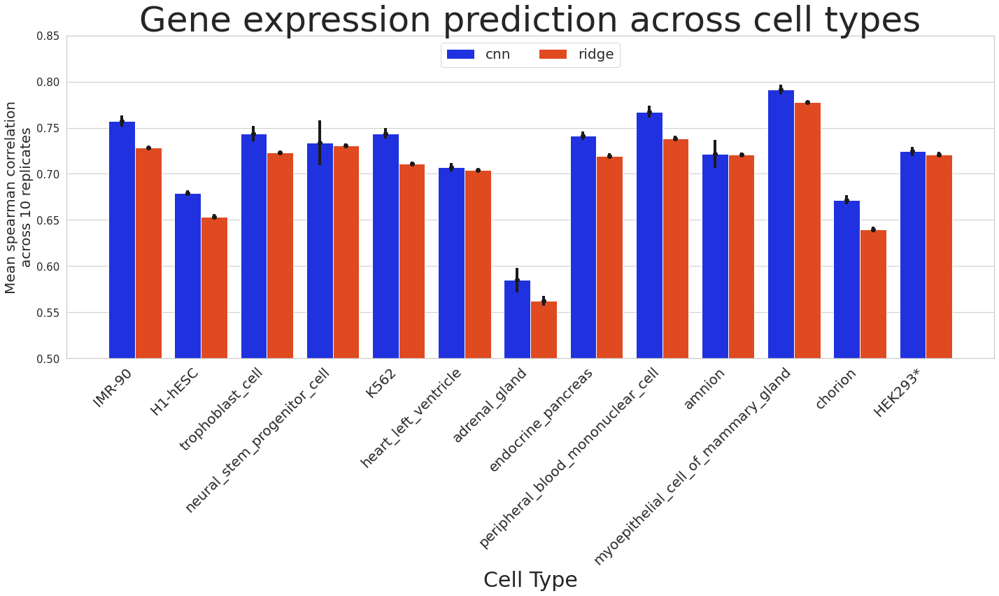

In [8]:
sns.set(style="whitegrid")
plt.rcParams.update({'figure.autolayout':True})
fig, ax = plt.subplots(figsize=(20, 12))
# df_results.plot.bar(x='cell_type', ax=ax)
sns.set_palette(sns.color_palette(plt.cm.jet(np.linspace(0.15, 0.85, 2))))
sns.barplot(x='cell_type', y='spearman_mean', hue='model', data=df_results, ax=ax)
# plt.tight_layout()
plt.ylim(0.5, 0.85)
plt.xlabel("Cell Type", fontsize=30)
plt.ylabel("Mean spearman correlation\nacross 10 replicates", fontsize=20)
plt.xticks(rotation=45, ha="right", fontsize=20)
plt.yticks(fontsize=15)
plt.legend(loc='upper center', ncol=2, fontsize=20)
plt.title("Gene expression prediction across cell types", fontsize=50)

x_coords = [p.get_x() + 0.5*p.get_width() for p in ax.patches]
y_coords = [p.get_height() for p in ax.patches]
y_err = [sd_dict[y] for y in y_coords]
plt.errorbar(x=x_coords, y=y_coords, yerr=y_err, fmt="o", c="k", linewidth=4)

plt.show()

In [9]:
# Is there a model-independent way of showing the source of this difference between cell types
# Compare between cell types using some metric (perhaps correlation; or pca?) and show that adrenal gland is an outlier

100%|██████████| 10/10 [00:17<00:00,  1.78s/it]


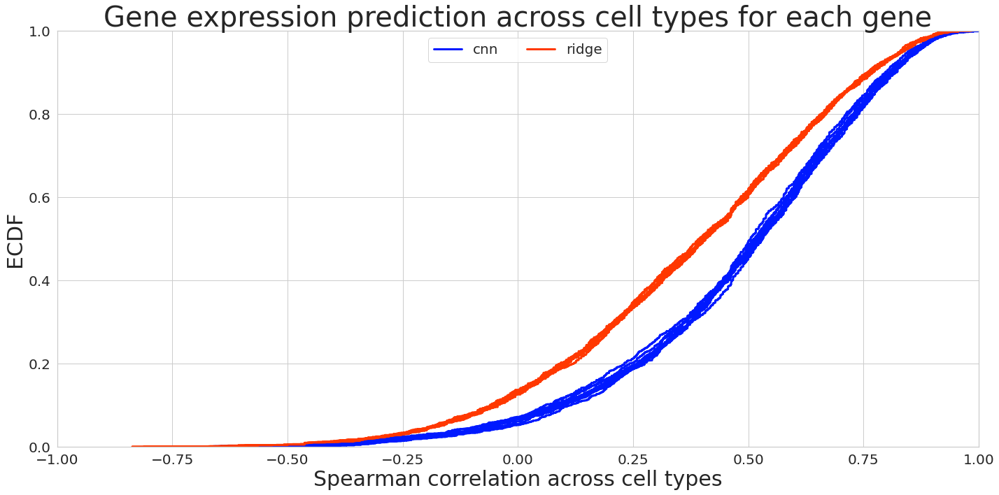

In [14]:
# In addition, we also create CDFs of spearmans for genes across cell types in all four of these models with error bars
for replicate in tqdm(range(1, 11)):

    transcript_sc_dict = {}
    transcript_results_dict = {}

    for model_type in ["maxpool", "linear"]:
        transcript_sc_dict[model_type] = {}
        yTrue = {}
        yPred = {}

        f_name = "../../../Logs/manuscript.R11.cross_cell_type_correlation.replicate_"+str(replicate)+"_0_transcriptome_401_5_32_"+model_type+"_mse_1_-1.testing_metrics.tsv"
        f_results = open(f_name, 'r')
        for line in f_results:
            vec = line.rstrip("\n").split("\t")
            transcript = vec[4]
            if(transcript in yTrue):
                yTrue[transcript].append(float(vec[5]))
                yPred[transcript].append(float(vec[6]))
            else:
                yTrue[transcript] = [float(vec[5])]
                yPred[transcript] = [float(vec[6])]

        f_results.close()
        for transcript in list(yTrue.keys()):                
            sc = spearmanr(yTrue[transcript], yPred[transcript])[0]

            if(transcript in transcript_sc_dict[model_type]):
                transcript_sc_dict[model_type][transcript].append(sc)
            else:
                transcript_sc_dict[model_type][transcript] = [sc]

        transcript_results_dict[model_type_rename_dict[model_type]] = []
        for transcript in list(transcript_sc_dict[model_type].keys()):
            mean_value = np.mean(transcript_sc_dict[model_type][transcript])

            # There are some genes with 0 correlation due to most yTrue being 0s: ignore them
            if(mean_value == 0):                
                # print(transcript, transcript_sc_dict[model_type][transcript],
                #       yTrue[transcript], yPred[transcript])
                continue
            
            transcript_results_dict[model_type_rename_dict[model_type]].append(mean_value)

            
    if(replicate == 2):
        plt.legend(loc='upper center', ncol=2, fontsize=20)
            
    # transcript_sc_dict
    # transcript_results_dict

    plt.rcParams["figure.figsize"] = (20, 10)
    sns.set_style('whitegrid')
    for k in list(transcript_results_dict.keys()):
        sns.ecdfplot(np.array(transcript_results_dict[k]), linewidth=3, label=k)

plt.xlim(-1, 1)
plt.ylim(0, 1)
plt.xlabel("Spearman correlation across cell types", fontsize=30)
plt.ylabel("ECDF", fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.title("Gene expression prediction across cell types for each gene", fontsize=40)

plt.show()
plt.close()


# TODO: Drop the zeros and find their source (is it all NaNs?)


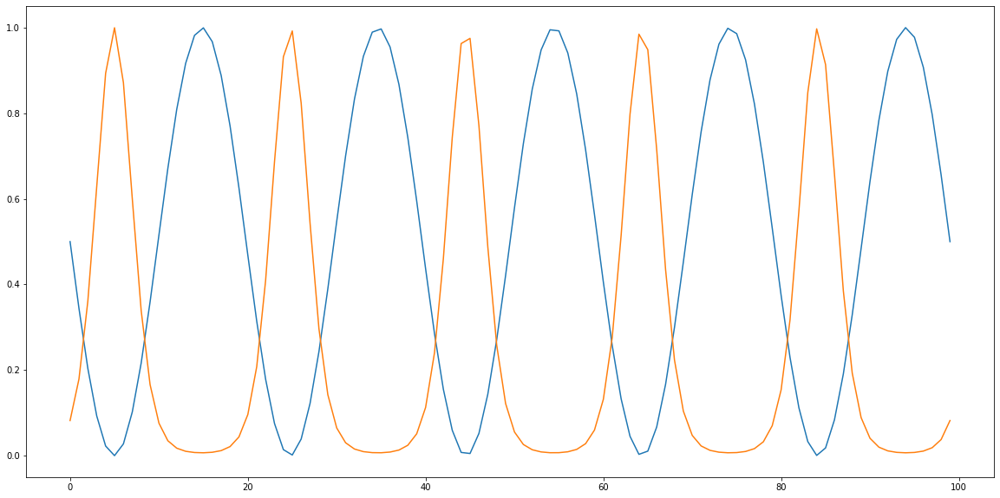

In [12]:
x = (np.sin(np.linspace(-5*np.pi,5*np.pi,100)) + 1) / 2
y = np.exp(-5 * x)
plt.plot(x)
plt.plot(y)
plt.show()

  0%|          | 0/100 [00:00<?, ?it/s]

SOX11 4 5
SOX11 0.03999999992272216 35.320001780391664


100%|██████████| 100/100 [01:44<00:00,  1.05s/it]


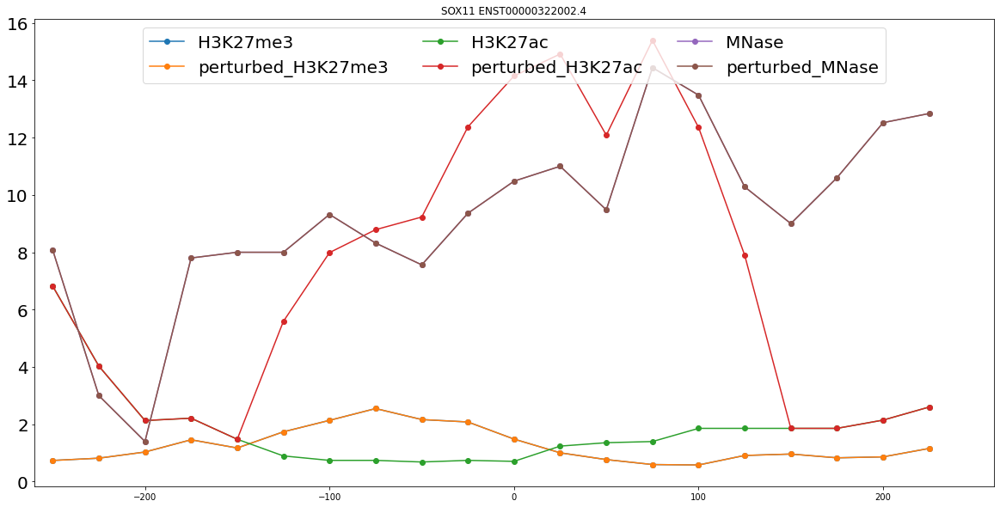

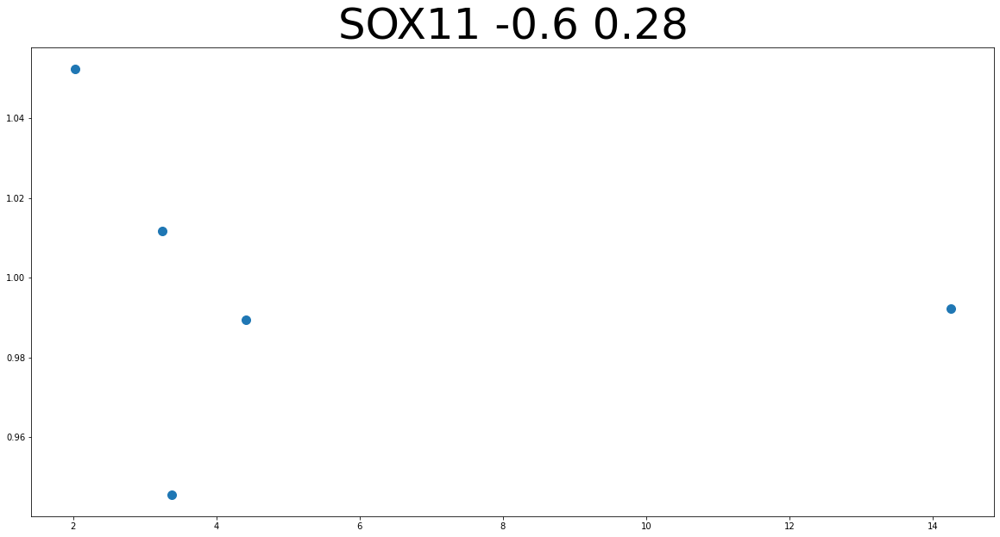

  0%|          | 0/100 [00:00<?, ?it/s]

PRSS12 4 5
PRSS12 2.52000003141653 49.68000161548398


100%|██████████| 100/100 [01:42<00:00,  1.02s/it]


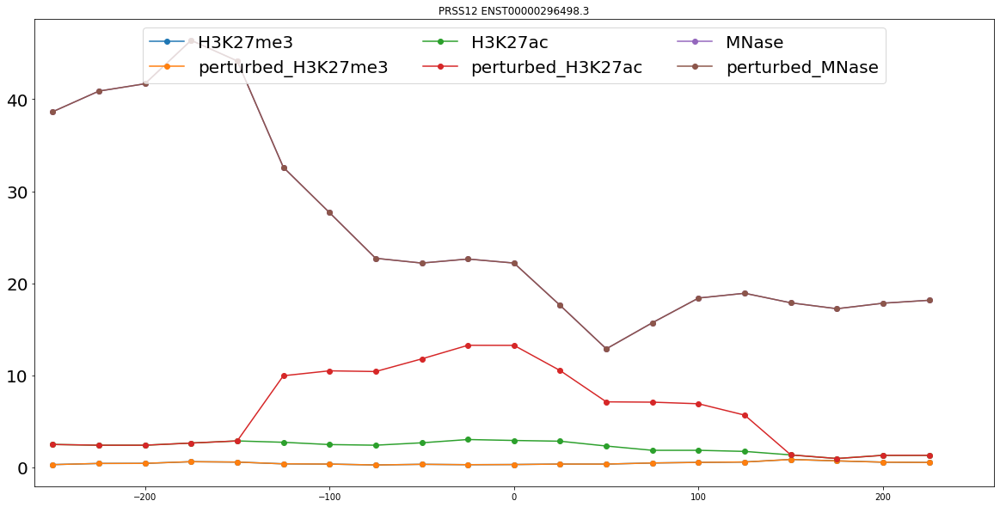

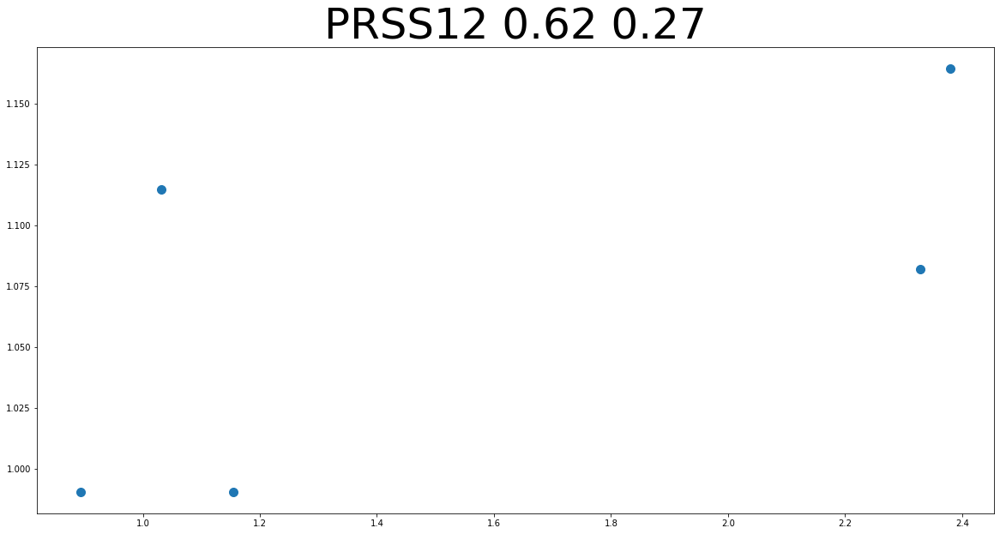

  0%|          | 0/100 [00:00<?, ?it/s]

MYO1G 4 5
MYO1G 5.720000213218748 51.15999912288865


100%|██████████| 100/100 [01:41<00:00,  1.02s/it]


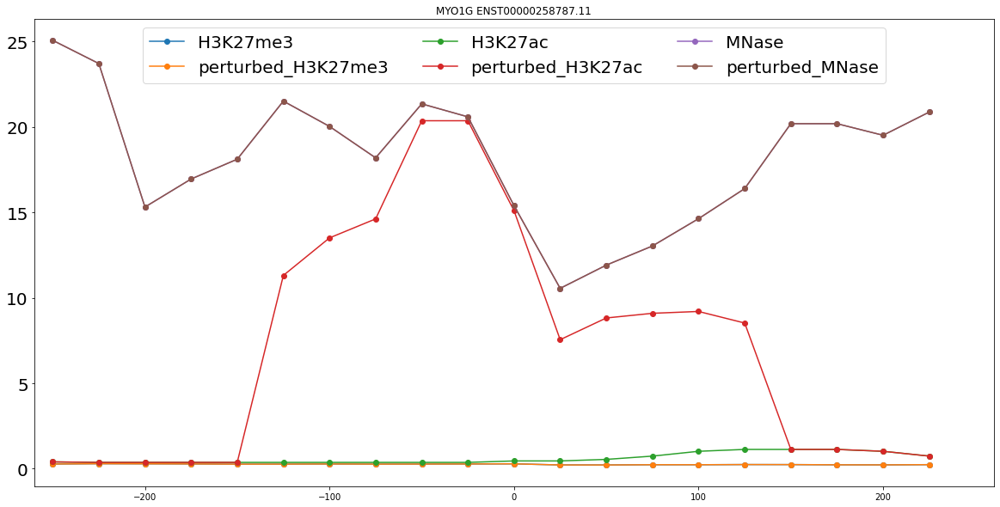

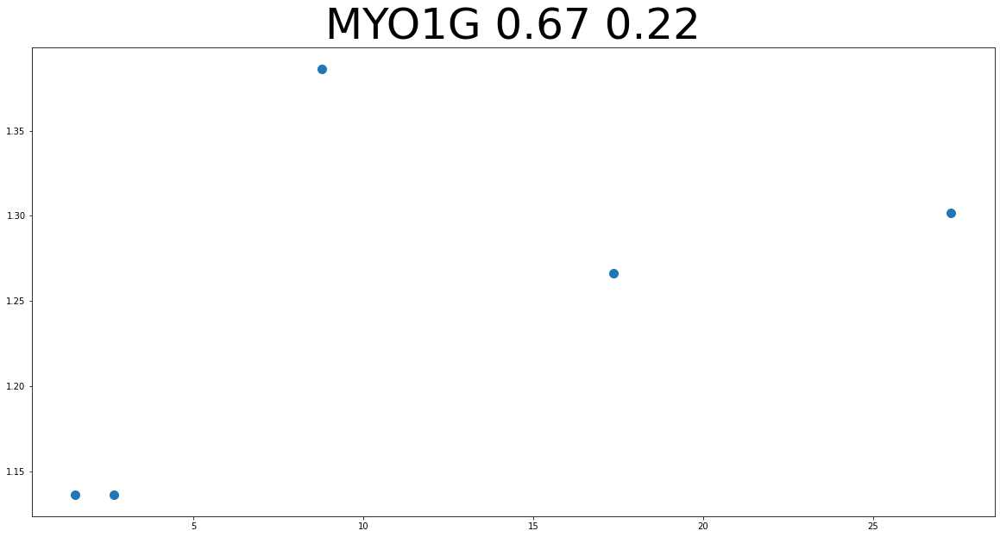

  0%|          | 0/100 [00:00<?, ?it/s]

CYP17A1 4 5
CYP17A1 2.920000291679677 69.43999544934037


100%|██████████| 100/100 [01:41<00:00,  1.01s/it]


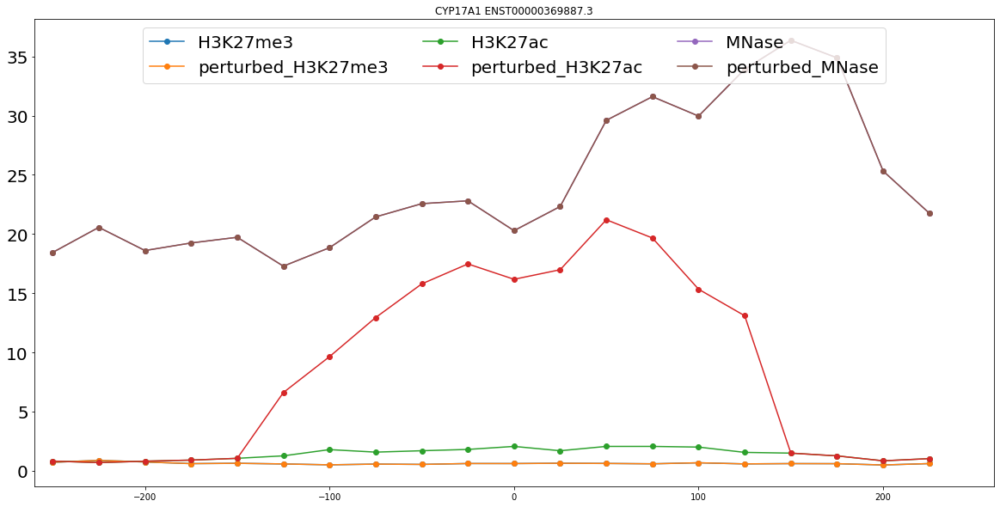

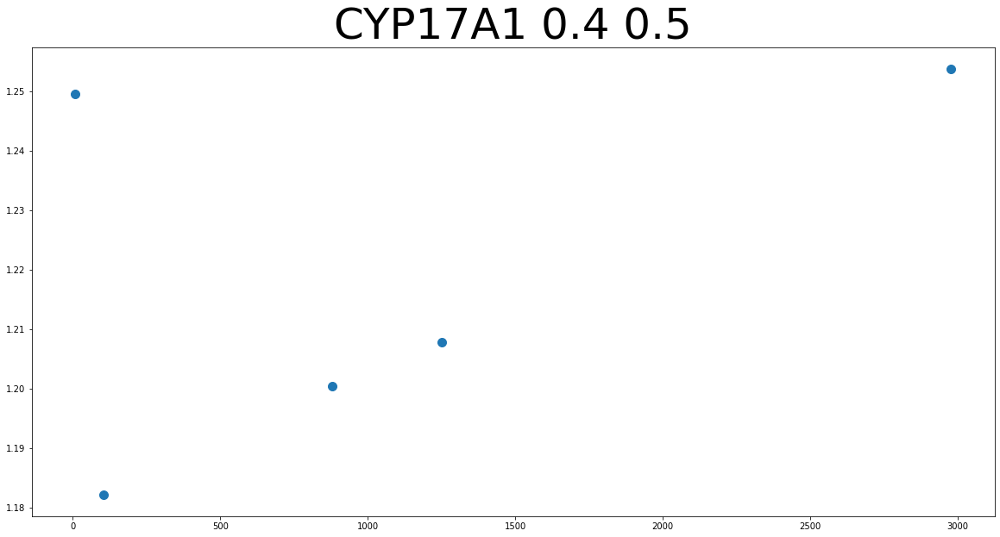

  0%|          | 0/100 [00:00<?, ?it/s]

CD79A 4 5
CD79A 5.199999417817478 42.67999765988334


100%|██████████| 100/100 [01:41<00:00,  1.01s/it]


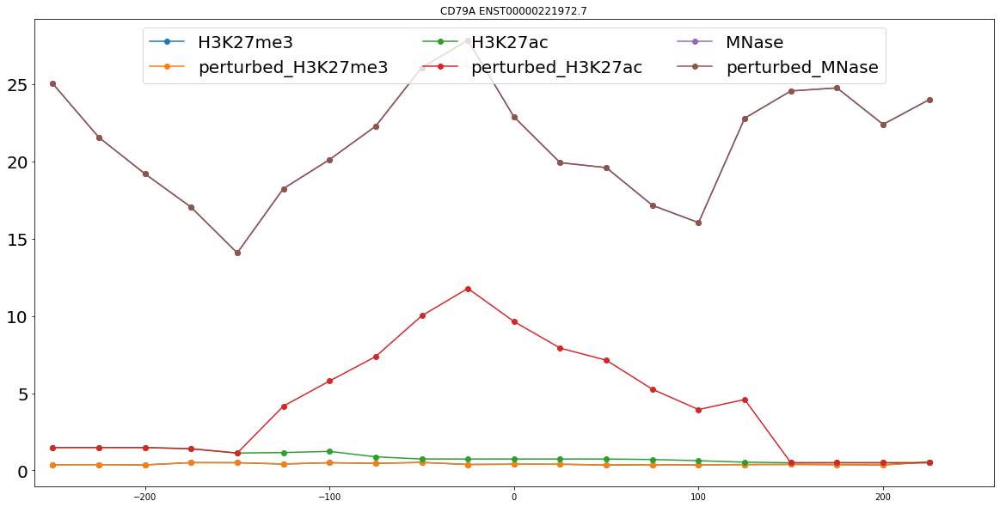

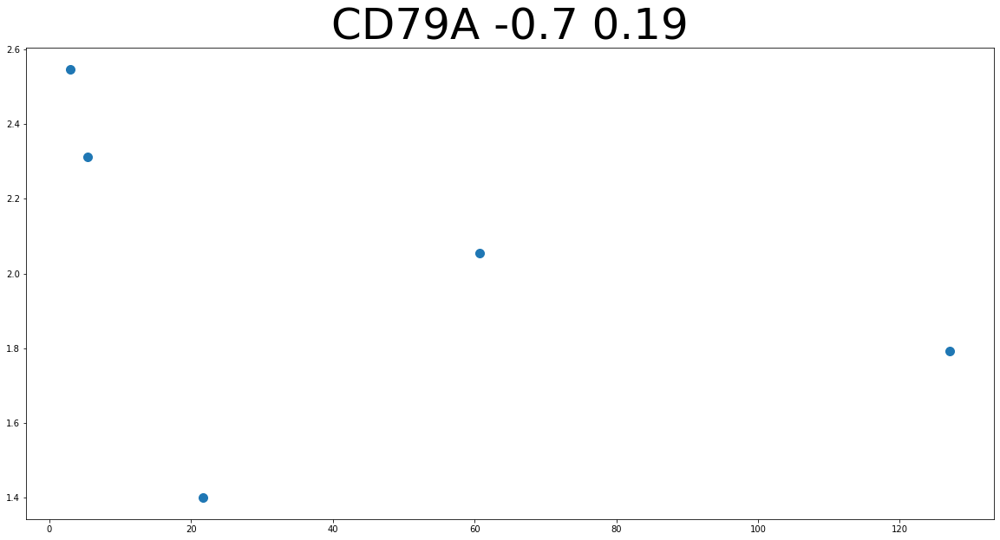

  0%|          | 0/100 [00:00<?, ?it/s]

C2CD4B 4 5
C2CD4B 0.0 28.759997070927405


100%|██████████| 100/100 [01:41<00:00,  1.02s/it]


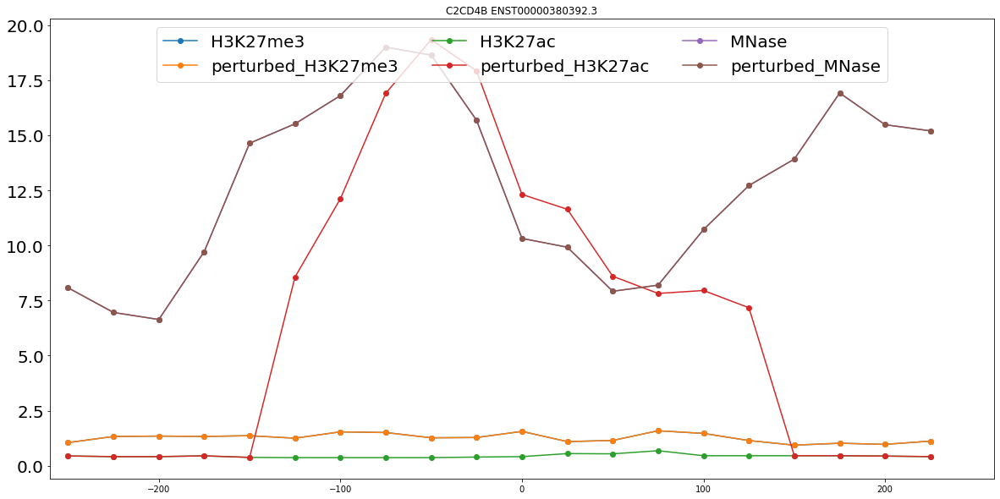

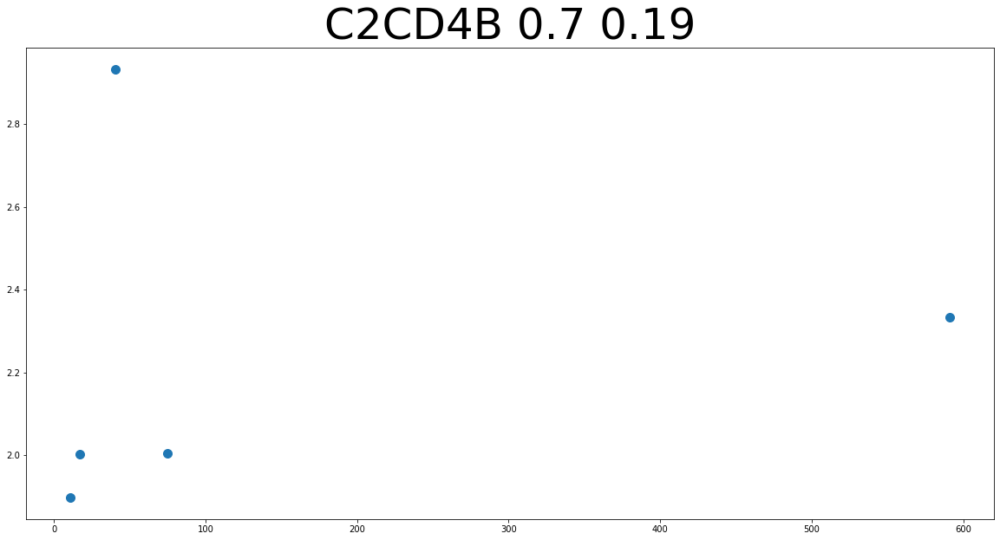

  0%|          | 0/100 [00:00<?, ?it/s]

TGFBR1 4 5
TGFBR1 1.0400000092945194 49.72000021699934


100%|██████████| 100/100 [01:40<00:00,  1.00s/it]


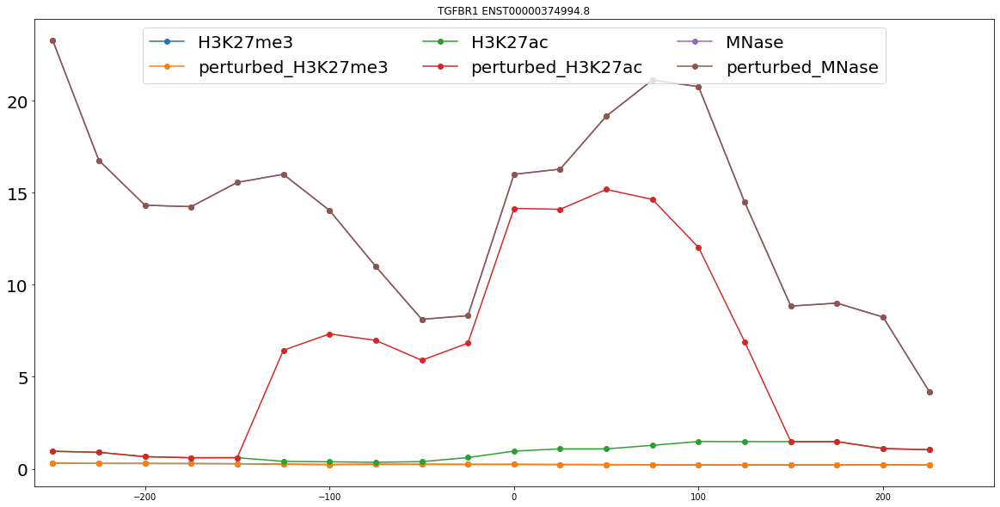

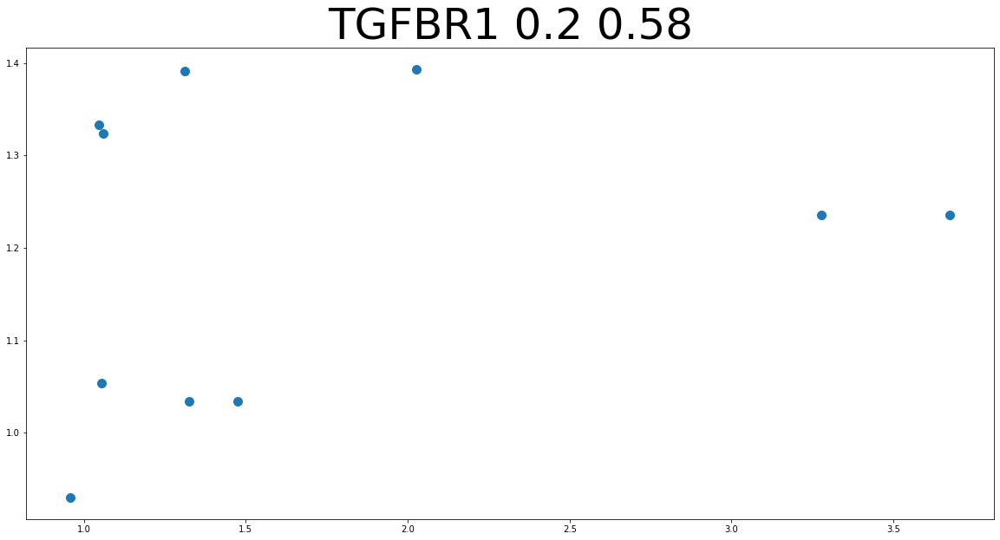

  0%|          | 0/100 [00:00<?, ?it/s]

CXCR4 4 5
CXCR4 0.6800000469050484 63.839999147246694


100%|██████████| 100/100 [01:41<00:00,  1.02s/it]


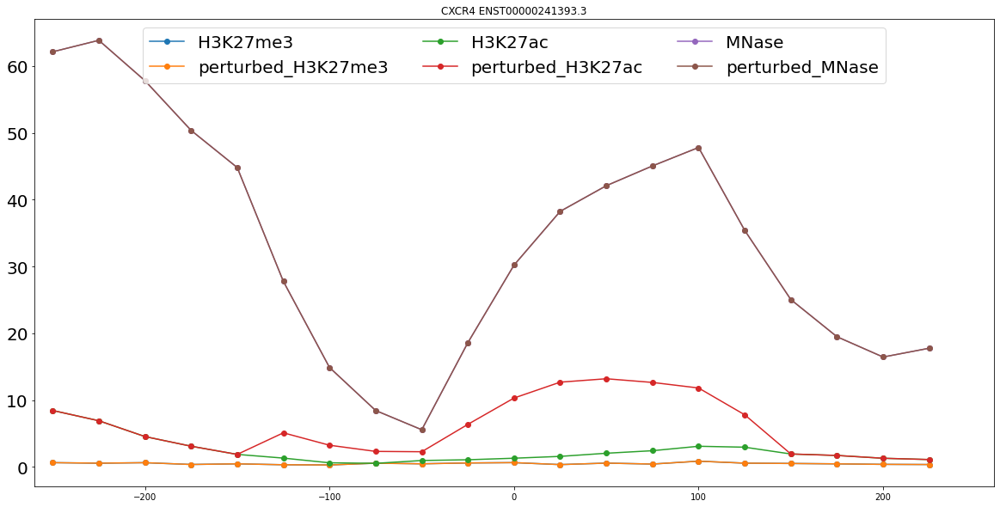

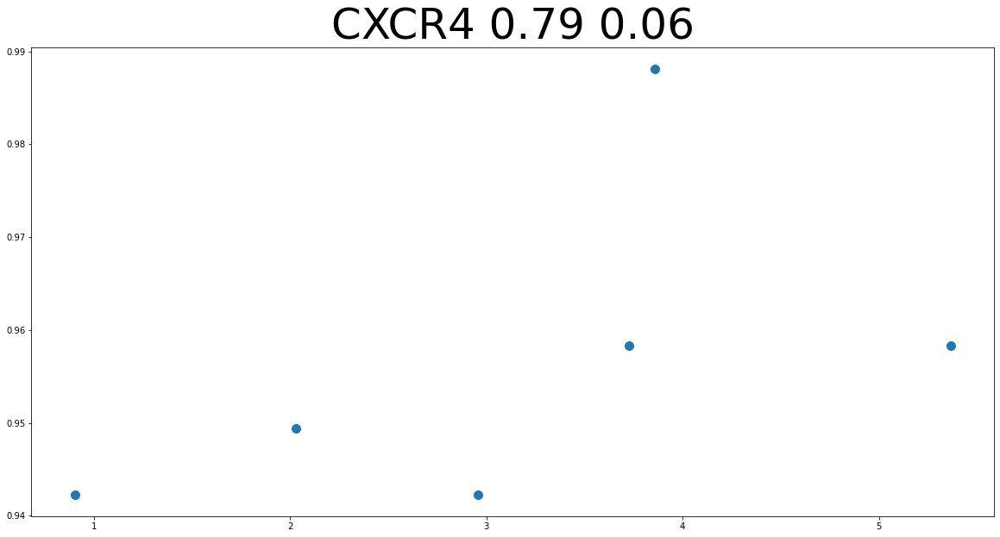

In [51]:
# Once we have established that we have a working model to predict endogenous gene expression
# which works better than ridge regression, we then want to understand what the model has learnt
# and then try to use this model to predict the effects of in vitro CRISPRa epigenome editing

# Figure 3 will contain the epigenetic data for the 8 genes along with in silico perturbation plots for the genes
# we want to show how these in silico perturbations vary across computational replicates
# we also want to show how they vary across context sizes

# the perturbation function is parametrized by the following parameters:
# a gaussian kernel centered at the gRNA target site with a bandwidth ( = 2 * \sigma)
# the inserted p-value
# the maximum inserted p-value



# We create a pipeline to predict the correlation with Alan's data (near the TSS within +-250bp)
# And analyze if we can overfit to what the perturbation should be like?

from tensorflow.keras.models import load_model
import sys
sys.path.insert(1, '../../../Code/deepENCODE/')
from chrmt_inference import perturb_x
from tensorflow.keras import backend as K


# Set plotting parameters
plt.rcParams["figure.figsize"] = (20, 10)
plt.gca().set_prop_cycle(None)


# First read Alan's data from the Google spreadsheet
sheet_name = "p300_Alan_Cabrera_epigenome_editing_dataset"
sheet_ID = "1rgbxJHon8Z6-Ke9hAK_uUzuR27SIZx8J5cZyz_jN2a8"
sheet_url = f"https://docs.google.com/spreadsheets/d/{sheet_ID}/gviz/tq?tqx=out:csv&sheet={sheet_name}"
df_p300 = pd.read_csv(sheet_url)

# Load Alan's data into a dict
p300_dict = {}

for gene in list(set(list(df_p300["p300 target gene"]))):
    p300_dict[gene] = {}
    for i in range(len(df_p300)):
        if(df_p300.iloc[i, 0] == gene):
            transcript = df_p300.iloc[i, 1]
            gRNA_ID = df_p300.iloc[i, 5]
            gRNA_bin_wrt_tss = int(df_p300.iloc[i, 14]) // RESOLUTION            
            measured_fold_change = float(df_p300.iloc[i, 6])
            
            # Only consider bins within +-250bp of the TSS ########################################## CAREFUL
            if(abs(gRNA_bin_wrt_tss) > 10):
                continue
            
            if((transcript, gRNA_ID, gRNA_bin_wrt_tss) in p300_dict[gene]):
                p300_dict[gene][(transcript, gRNA_ID, gRNA_bin_wrt_tss)].append(measured_fold_change)
            else:
                p300_dict[gene][(transcript, gRNA_ID, gRNA_bin_wrt_tss)] = [measured_fold_change]            


# Initialize some dicts
transcript_list = [("ENST00000241393.3", "CXCR4"),
                   ("ENST00000374994.8", "TGFBR1"),
                   ("ENST00000380392.3", "C2CD4B"),
                   ("ENST00000221972.7", "CD79A"),
                   ("ENST00000369887.3", "CYP17A1"),
                   ("ENST00000258787.11", "MYO1G"),
                   ("ENST00000296498.3", "PRSS12"),
                   ("ENST00000322002.4", "SOX11")]

# First thing we do is to load the MNase-seq data for each transcript and then visualize its distribution near the TSS of each gene
# We then estimate gene-specific normalization so that each gene's MNase data can be scaled to [0, 1]
# When performing the perturbation, we use this data as opposed to the raw MNase coverage. 
# This is because in the perturbation we want to scale amount of H3K27ac added, by P(nucleosome)

MNase_dict = {}
for transcript_index in np.arange(len(transcript_list)):

    transcript = transcript_list[transcript_index][0]
    gene = transcript_list[transcript_index][1]
    epigenetic_features = np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(-1)+".npy")
    
    MNase = np.expm1(epigenetic_features[0, :, -1]) # after the expm1, the MNase is now coverage
    
    min_MNase = np.min(MNase)
    max_MNase = np.max(MNase)
    
    MNase_dict[gene] = (min_MNase, max_MNase)
    
#     transformed_MNase = [(x - min_MNase) / (max_MNase - min_MNase) for x in MNase]
    
#     plt.plot(transformed_MNase)
# #     sns.kdeplot(x=MNase, fill=False, common_norm=False, palette="crest", alpha=.5, linewidth=3, cumulative=True)
# #     plt.ylim(0.8, 1.01)
#     plt.show()
#     plt.close()

num_layers_dict = {9:2, 13:2, 17:2, 21:2, 25:2,
                   31:3, 41:3, 51:3, 61:3, 71:3,
                   81:4, 101:4, 121:4, 141:4, 161:4, 181:4, 201:4, 221:4, 241:4,
                   261:5, 281:5, 301:5, 321:5, 341:5, 361:5, 381:5, 401:5}

ise_mean_fold_change_dict = {}
ise_stdev_fold_change_dict = {}

results_list = []

# Then, for a particular transcript, we compute the ISE scores mean-ed across many models and compare with Alan's data
for transcript_index in np.arange(len(transcript_list)-1, -1, -1):

    inserted_peak_width = 10
    inserted_scalar = 2000 # ln(x+1) = 3.1  => x+1 ~ 21 => x == -log10(p-value) = 20
    maximum_inserted_minuslog10_p_value = 20
    gaussian_bandwidth_choices = [4]
    nucleosome_lambda_choices = [5] 
    stranded_MNase_offset = 0

    ise_radius = 10
    bin_wrt_tss_choices = list(range(-ise_radius, ise_radius)) # region where we perform ISE
    
    for gaussian_bandwidth in gaussian_bandwidth_choices:

        for nucleosome_lambda in nucleosome_lambda_choices:

            for t_pair in [transcript_list[transcript_index]]:

                transcript = t_pair[0]
                gene = t_pair[1]

                print(gene, gaussian_bandwidth, nucleosome_lambda)
                
                epigenetic_features = np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(-1)+".npy")
                TPM = (np.power(10, np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(-1)+".TPM.npy")) - 1)[0][0]    
    #             print(epigenetic_features.shape, TPM)

                min_MNase = MNase_dict[gene][0]
                max_MNase = MNase_dict[gene][1]      
            
                print(gene, min_MNase, max_MNase)
    
                for model_type in ["maxpool"]:

                    for context_size in [401]: # list(num_layers_dict.keys())[16:]:
                        half_window = context_size // 2

                        num_layers = num_layers_dict[context_size]

                        fold_change_dict = {}

                        for replicate in tqdm(range(1, 101)):

                            K.clear_session() # 2022 and what an insane bug in Keras! Time to switch to PyTorch
                            trained_model = load_model("../../../Models/manuscript.R13.stochastic_chromosomes.replicate_"+str(replicate)+"_0_transcriptome_"+str(context_size)+"_"+str(num_layers)+"_32_"+str(model_type)+"_mse_1_-1.hdf5", compile=False)    

                            key = (gaussian_bandwidth, nucleosome_lambda)

                            fold_change_list = []

                            for bin_wrt_tss in bin_wrt_tss_choices:
                                perturbed_epigenetic_features = perturb_x(epigenetic_features, bin_wrt_tss, inserted_peak_width, inserted_scalar, stranded_MNase_offset, maximum_inserted_minuslog10_p_value, gaussian_bandwidth, nucleosome_lambda, min_MNase, max_MNase)
                                predicted_log10p1_TPM = trained_model.predict(perturbed_epigenetic_features[:, 200-half_window:200+half_window+1, :-1]) # This is 200 because of the size of the loaded epigenetic features numpy array
                                predicted_TPM = (np.power(10, predicted_log10p1_TPM) - 1)[0][0]
                                predicted_native_TPM = np.power(10, trained_model.predict(epigenetic_features[:, 200-half_window:200+half_window+1, :-1])[0][0]) -1 # Same reason for 200, as above
                                fold_change_list.append(predicted_TPM / predicted_native_TPM)

                            if(key in fold_change_dict):
                                fold_change_dict[key].append(fold_change_list)
                            else:
                                fold_change_dict[key] = [fold_change_list]

                        mean_fold_change_list = np.mean(fold_change_dict[key], axis=0)
                        stdev_fold_change_list = np.std(fold_change_dict[key], axis=0)

                        y_lower = [x[0] - x[1] for x in list(zip(mean_fold_change_list, stdev_fold_change_list))]
                        y_upper = [x[0] + x[1] for x in list(zip(mean_fold_change_list, stdev_fold_change_list))]

#                         plt.plot([RESOLUTION * x for x in bin_wrt_tss_choices], mean_fold_change_list, 'o-',
#                                   label=str(context_size)+"_"+str(inserted_peak_width)+"_"+str(inserted_lnp1_minuslog10_p_value))
#                         plt.fill_between([RESOLUTION * x for x in bin_wrt_tss_choices], y_lower, y_upper, alpha = 0.2, label='')

#                         plt.xlim((RESOLUTION + 1) * -ise_radius, (RESOLUTION + 1) * ise_radius)
#                         plt.ylim(-1, 8)

#                     plt.xticks(fontsize=20)
#                     plt.yticks(fontsize=20)    
#                     plt.ylabel("Fold Change", fontsize=30)
#                     plt.xlabel("distance to TSS (in bp)", fontsize=30)

#                     plt.legend(loc="upper center", ncol=5)
#                     plt.title("Model = " + str(model_type_rename_dict[model_type]) + "  Gene = " + str(gene), fontsize=50)
#                     plt.show()
#                     plt.close()

                    ise_mean_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)] = mean_fold_change_list
                    ise_stdev_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)] = stdev_fold_change_list

                    # Now we compare the model predictions w.r.t Alan's data

                    scatter_dict = {}                
                    scatter_dict[gene] = {}
                    scatter_dict[gene][model_type_rename_dict[model_type]] = []

                    max_fold_change = 1

                    for (transcript, gRNA, pos) in p300_dict[gene].keys():

                        # If the gRNA_bin_wrt_TSS which is named pos, is not within the ise_radius, then ignore
                        if(abs(pos) > ise_radius):
                            print(ise_radius, pos, file=sys.stderr)
                            continue

                        fold_change_list = p300_dict[gene][(transcript, gRNA, pos)]
                        mean_fold_change = np.mean(fold_change_list)
                        stdev_fold_change = np.std(fold_change_list)

#                         plt.errorbar(x=RESOLUTION * pos, y=mean_fold_change, marker='o', markersize=10, yerr=stdev_fold_change, color="k")

                        if(mean_fold_change > max_fold_change):
                            max_fold_change = mean_fold_change

                        scatter_dict[gene][model_type_rename_dict[model_type]].append((mean_fold_change, ise_mean_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)][ise_radius + pos]))

                    # Then we overlay with the predictions from the models by creating a scatter plot and computing spearman
                    model_type_color_dict = {"linear":"red", "maxpool":"blue"}
                    mean_predictions = ise_mean_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)]
                    stdev_predictions = ise_stdev_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)]

#                     plt.errorbar(x=[RESOLUTION * x for x in range(-ise_radius, ise_radius)], y=[1.8 * x * max_fold_change for x in mean_predictions], yerr=[0.1 * x * max_fold_change for x in stdev_predictions], marker='o', color=model_type_color_dict[model_type], label=model_type_rename_dict[model_type])

#                     Plot epigenetic features instead of model predictions
#                     Load epigenetic features in HEK293T
                    epigenetic_features = np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(-1)+".npy")
#                     print(epigenetic_features.shape)
                    perturbed_epigenetic_features = perturb_x(epigenetic_features, 0, inserted_peak_width, inserted_scalar, stranded_MNase_offset, maximum_inserted_minuslog10_p_value, gaussian_bandwidth, nucleosome_lambda, min_MNase, max_MNase)

                    for assay_index in [1, 2, -1]:
                        plt.plot([RESOLUTION * x for x in range(-ise_radius, ise_radius)], [1 * np.expm1(x) * 1 for x in epigenetic_features[0, 200-ise_radius:200+ise_radius, assay_index]], 'o-', label=assays[assay_index])
                        plt.plot([RESOLUTION * x for x in range(-ise_radius, ise_radius)], [1 * np.expm1(x) * 1 for x in perturbed_epigenetic_features[0, 200-ise_radius:200+ise_radius, assay_index]], 'o-', label="perturbed_"+assays[assay_index])
            
                    plt.xlim((RESOLUTION + 1) * -ise_radius, (RESOLUTION + 1) * ise_radius)
                    plt.yticks(fontsize=20)
                    plt.title(gene + " " + transcript)
                    plt.legend(loc="upper center", fontsize=20, ncol=3)
                    plt.show()
                    plt.close()

                    scatter_x = [x[0] for x in scatter_dict[gene][model_type_rename_dict[model_type]]]
                    scatter_y = [x[1] for x in scatter_dict[gene][model_type_rename_dict[model_type]]]

                    plt.scatter(scatter_x, scatter_y, s=100)

                    sc, sp = spearmanr(scatter_x, scatter_y)
                    results_list.append([transcript, gene, round(key[0], 4), round(key[1], 4), model_type_rename_dict[model_type], round(sc, 2), round(sp, 2)])
#     print(results_list)
            
                    plt.title(gene + " " + str(round(sc, 2)) + " " + str(round(sp, 2)), fontsize=50)
                    plt.show()
                    plt.close()

SOX11 4.1 0.5


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


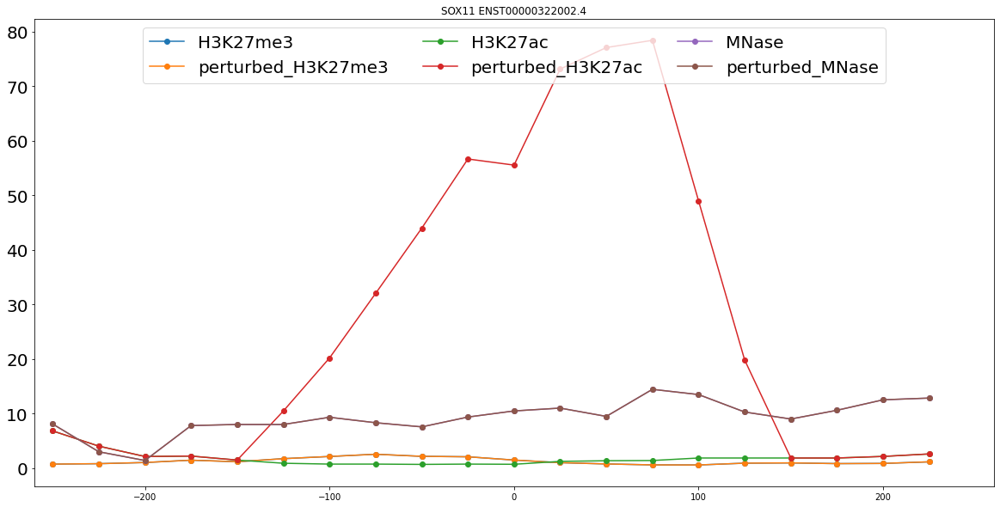

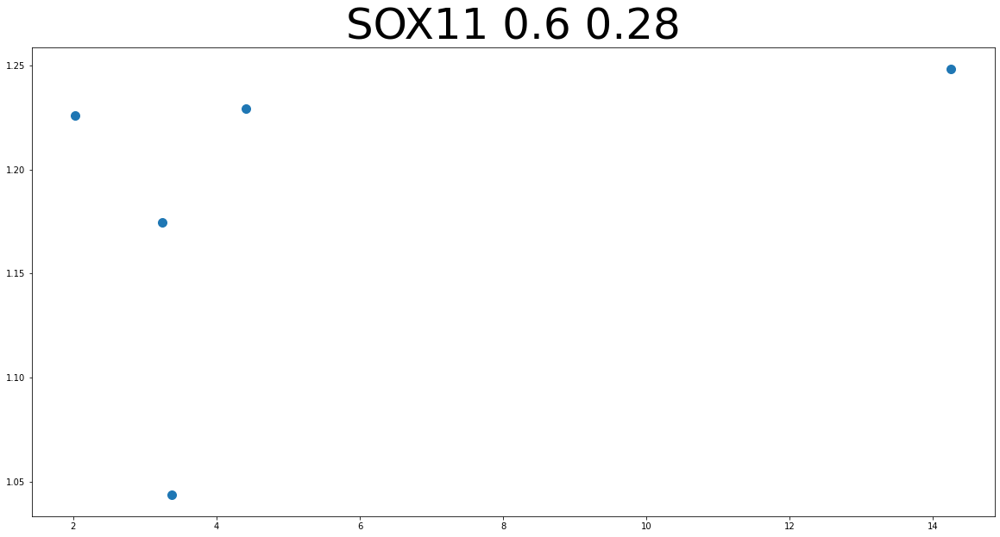

PRSS12 4.1 0.5


100%|██████████| 100/100 [01:33<00:00,  1.07it/s]


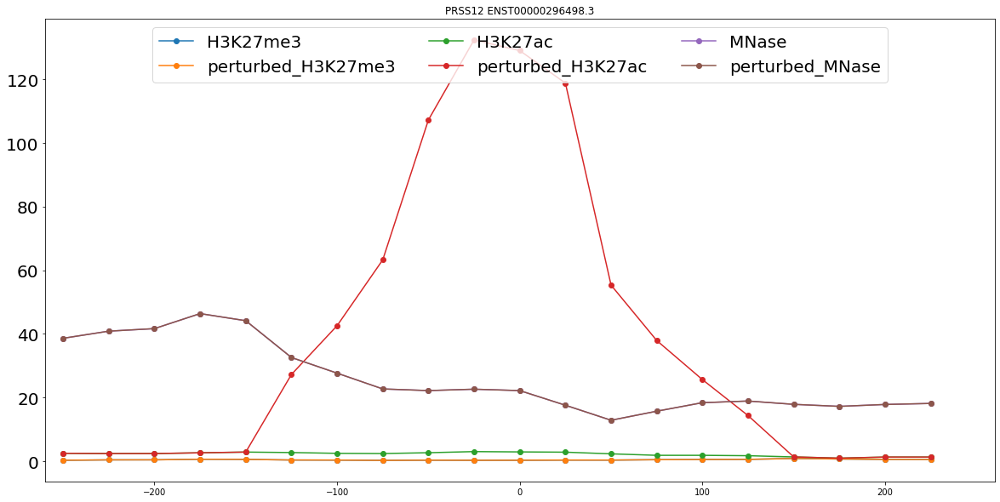

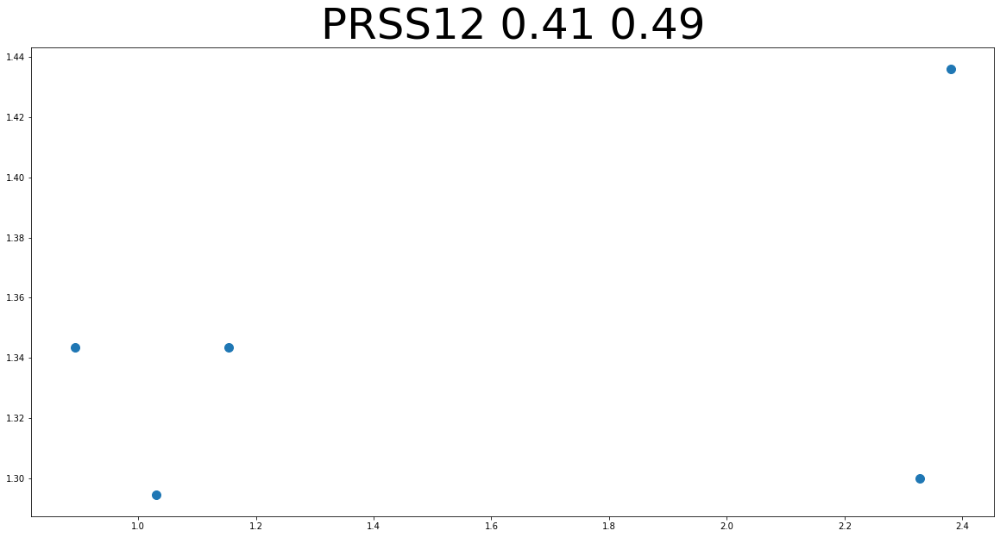

MYO1G 4.1 0.5


100%|██████████| 100/100 [01:33<00:00,  1.07it/s]


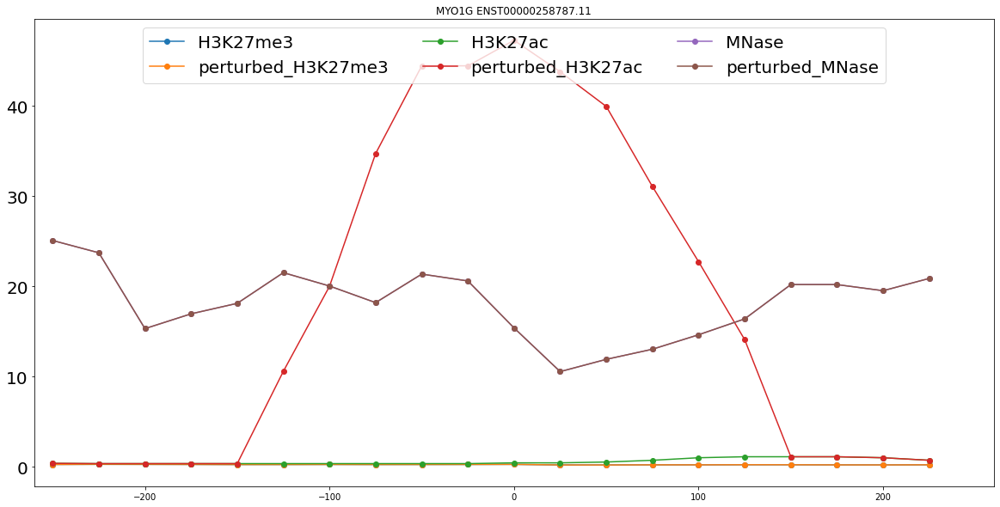

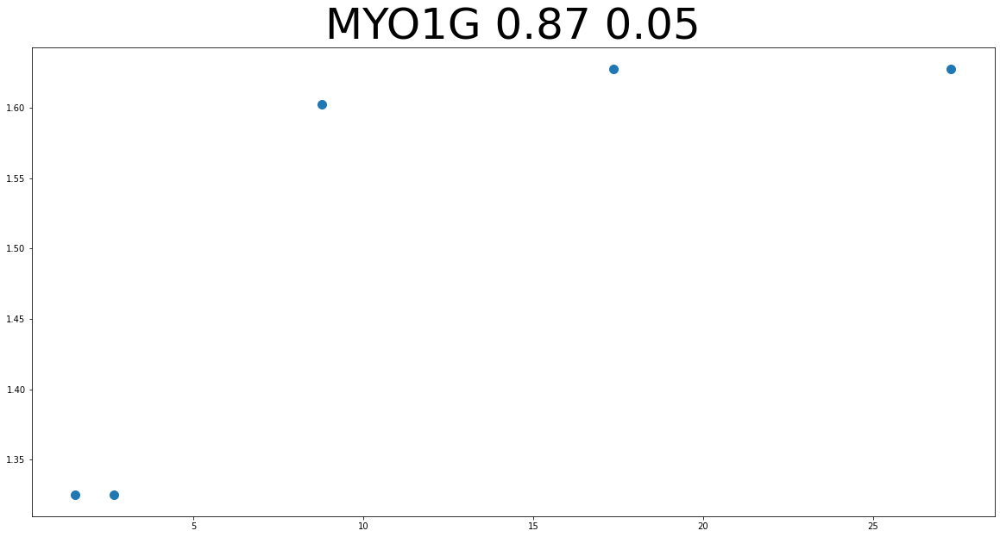

CYP17A1 4.1 0.5


100%|██████████| 100/100 [01:33<00:00,  1.07it/s]


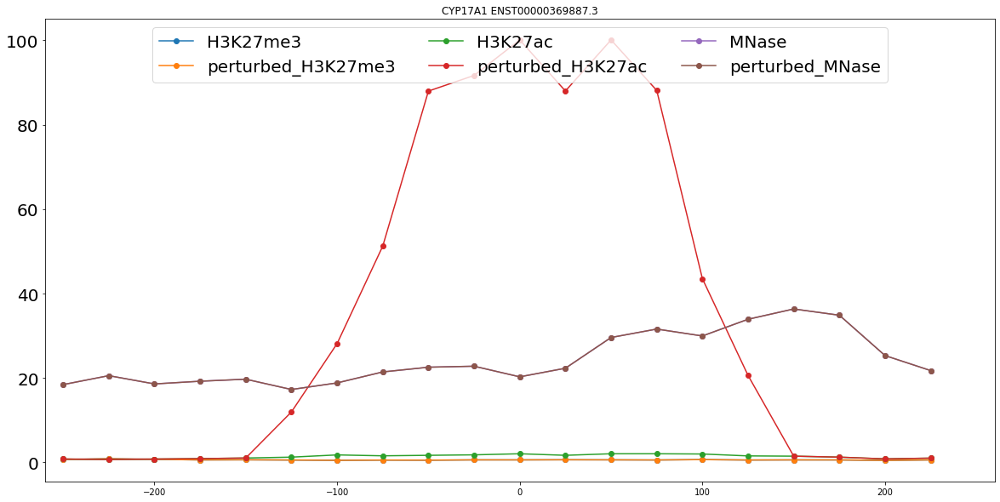

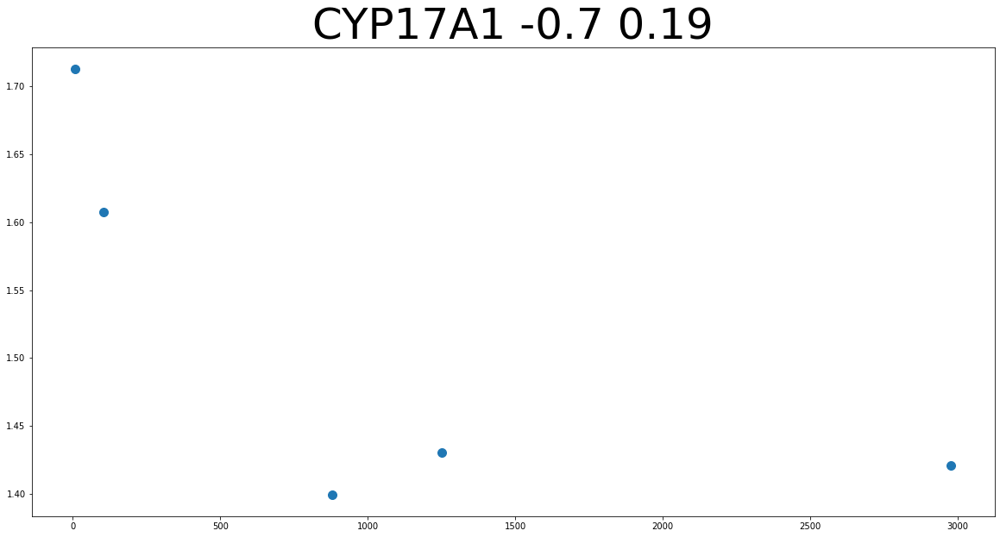

CD79A 4.1 0.5


100%|██████████| 100/100 [01:33<00:00,  1.07it/s]


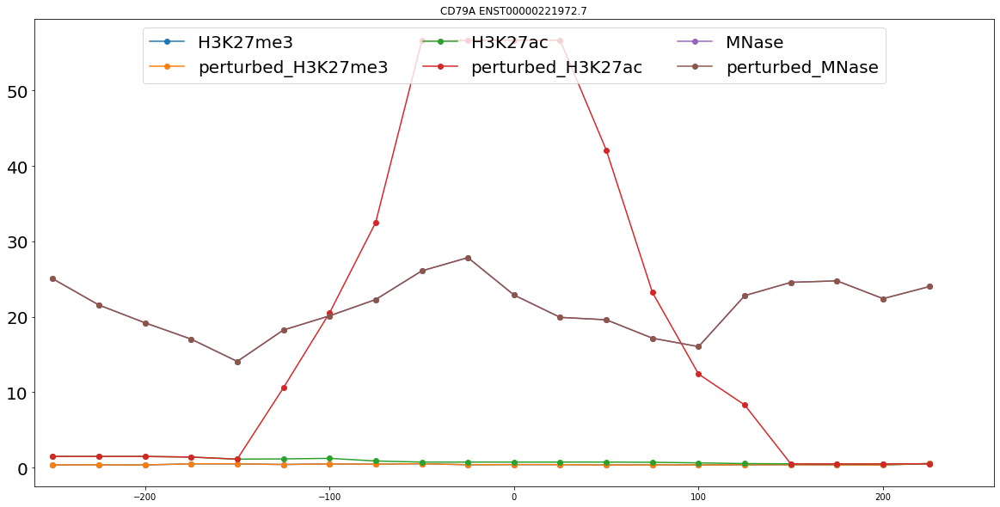

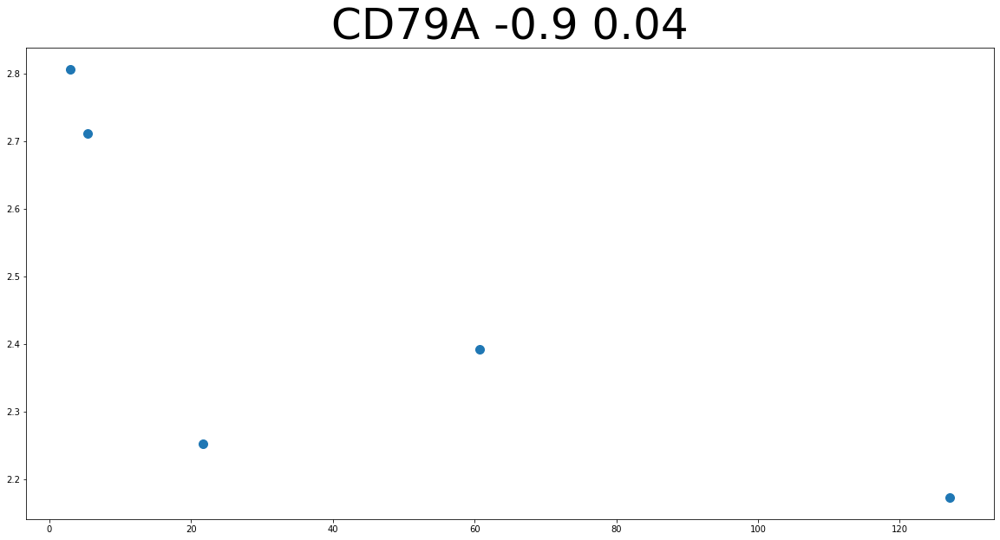

C2CD4B 4.1 0.5


100%|██████████| 100/100 [01:35<00:00,  1.05it/s]


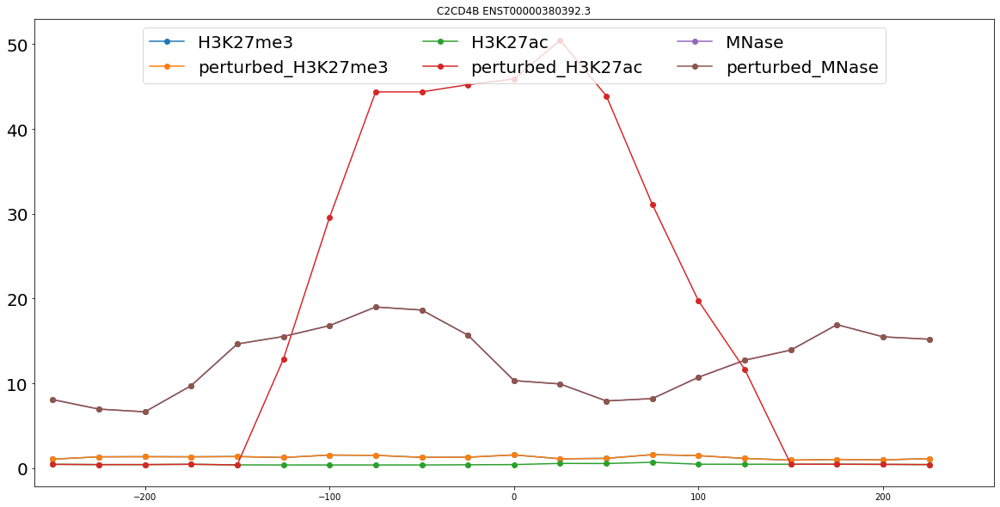

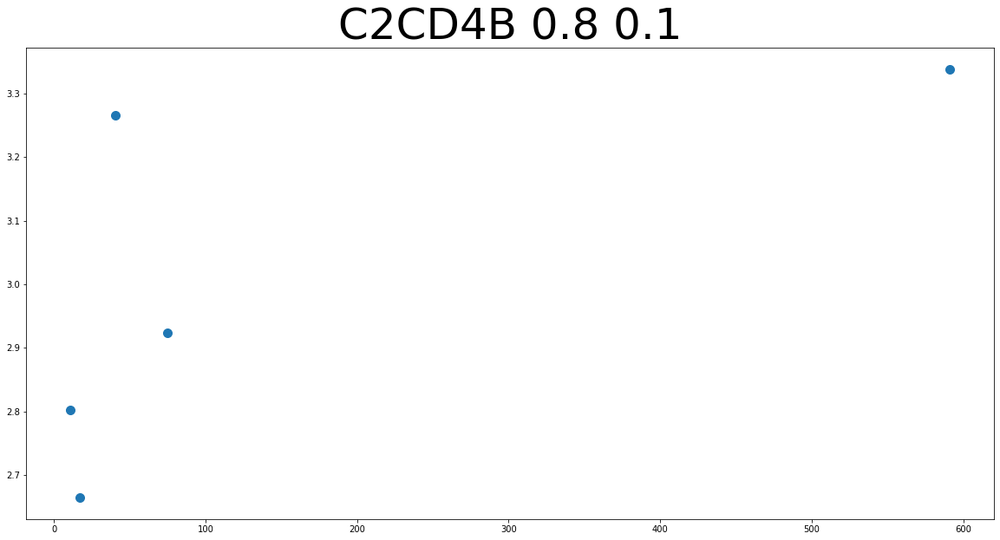

TGFBR1 4.1 0.5


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


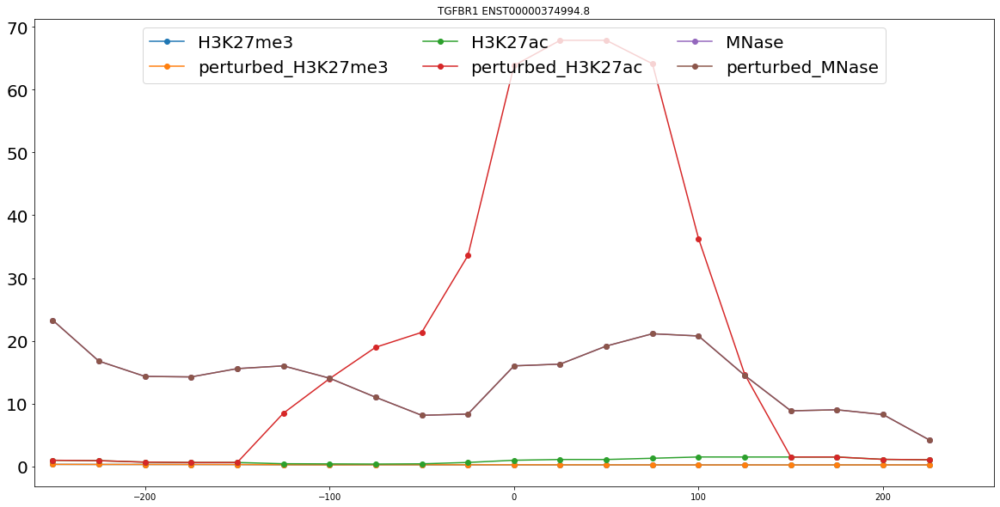

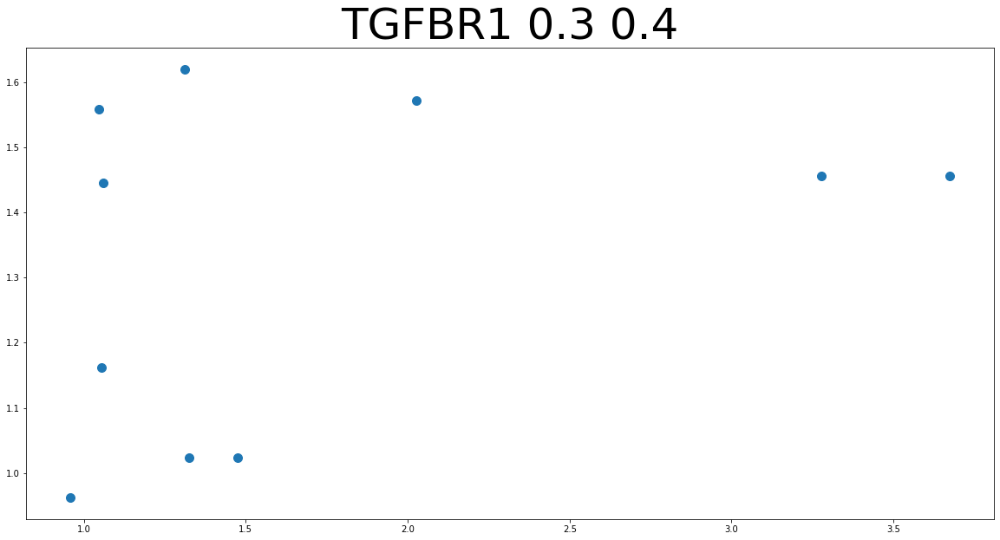

CXCR4 4.1 0.5


100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


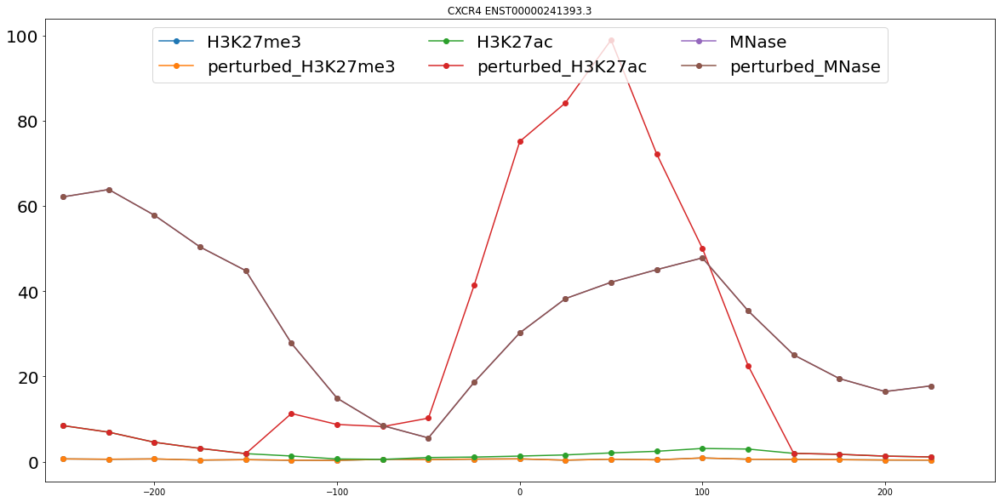

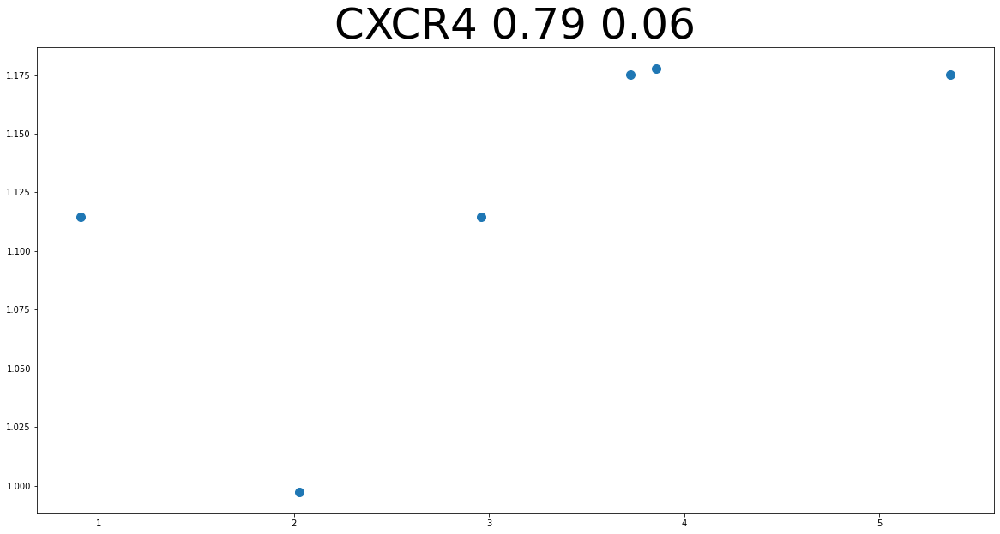

In [57]:
# read in list 
results_list = []
f_results = open("../../../Logs/output_9.txt", 'r')
for line in f_results:
    vec = line.rstrip("]\n").lstrip("[").split(", ")
    vec2 = [x.rstrip("'").lstrip("'") for x in vec]

    l = [vec2[0], vec2[1], float(vec2[4]), float(vec2[6]), vec2[2], float(vec2[8]), float(vec2[9])]

    if( (float(vec2[5]) == 20.0) and (float(vec2[7]) == 5.0) ):
        results_list.append(l)

f_results.close()
results_list


[['ENST00000241393.3', 'CXCR4', 1000.0, 2.0, 'cnn', 0.794, 0.059],
 ['ENST00000374994.8', 'TGFBR1', 1000.0, 2.0, 'cnn', 0.335, 0.343],
 ['ENST00000380392.3', 'C2CD4B', 1000.0, 2.0, 'cnn', 0.5, 0.391],
 ['ENST00000221972.7', 'CD79A', 1000.0, 2.0, 'cnn', -0.7, 0.188],
 ['ENST00000369887.3', 'CYP17A1', 1000.0, 2.0, 'cnn', 0.9, 0.037],
 ['ENST00000258787.11', 'MYO1G', 1000.0, 2.0, 'cnn', 0.667, 0.219],
 ['ENST00000296498.3', 'PRSS12', 1000.0, 2.0, 'cnn', 0.821, 0.089],
 ['ENST00000322002.4', 'SOX11', 1000.0, 2.0, 'cnn', -0.8, 0.104],
 ['ENST00000241393.3', 'CXCR4', 1000.0, 3.0, 'cnn', 0.794, 0.059],
 ['ENST00000374994.8', 'TGFBR1', 1000.0, 3.0, 'cnn', 0.201, 0.577],
 ['ENST00000380392.3', 'C2CD4B', 1000.0, 3.0, 'cnn', 0.5, 0.391],
 ['ENST00000221972.7', 'CD79A', 1000.0, 3.0, 'cnn', -0.7, 0.188],
 ['ENST00000369887.3', 'CYP17A1', 1000.0, 3.0, 'cnn', 0.9, 0.037],
 ['ENST00000258787.11', 'MYO1G', 1000.0, 3.0, 'cnn', 0.667, 0.219],
 ['ENST00000296498.3', 'PRSS12', 1000.0, 3.0, 'cnn', 0.616, 0.

In [22]:
results_list_2 = results_list + results_list_1
results_list_2

[['ENST00000322002.4', 'SOX11', 3.1, 0.1, 'ridge', -0.1, 0.87],
 ['ENST00000322002.4', 'SOX11', 3.1, 0.1, 'cnn', -0.5, 0.39],
 ['ENST00000322002.4', 'SOX11', 3.1, 2.1, 'ridge', 0.2, 0.75],
 ['ENST00000322002.4', 'SOX11', 3.1, 2.1, 'cnn', -0.5, 0.39],
 ['ENST00000322002.4', 'SOX11', 3.1, 4.1, 'ridge', 0.2, 0.75],
 ['ENST00000322002.4', 'SOX11', 3.1, 4.1, 'cnn', -0.6, 0.28],
 ['ENST00000322002.4', 'SOX11', 3.1, 6.1, 'ridge', 0.2, 0.75],
 ['ENST00000322002.4', 'SOX11', 3.1, 6.1, 'cnn', -0.6, 0.28],
 ['ENST00000322002.4', 'SOX11', 4.1, 0.1, 'ridge', -0.5, 0.39],
 ['ENST00000322002.4', 'SOX11', 4.1, 0.1, 'cnn', -0.6, 0.28],
 ['ENST00000322002.4', 'SOX11', 4.1, 2.1, 'ridge', -0.1, 0.87],
 ['ENST00000322002.4', 'SOX11', 4.1, 2.1, 'cnn', -0.6, 0.28],
 ['ENST00000322002.4', 'SOX11', 4.1, 4.1, 'ridge', 0.2, 0.75],
 ['ENST00000322002.4', 'SOX11', 4.1, 4.1, 'cnn', -0.5, 0.39],
 ['ENST00000322002.4', 'SOX11', 4.1, 6.1, 'ridge', 0.5, 0.39],
 ['ENST00000322002.4', 'SOX11', 4.1, 6.1, 'cnn', -0.6, 0.28

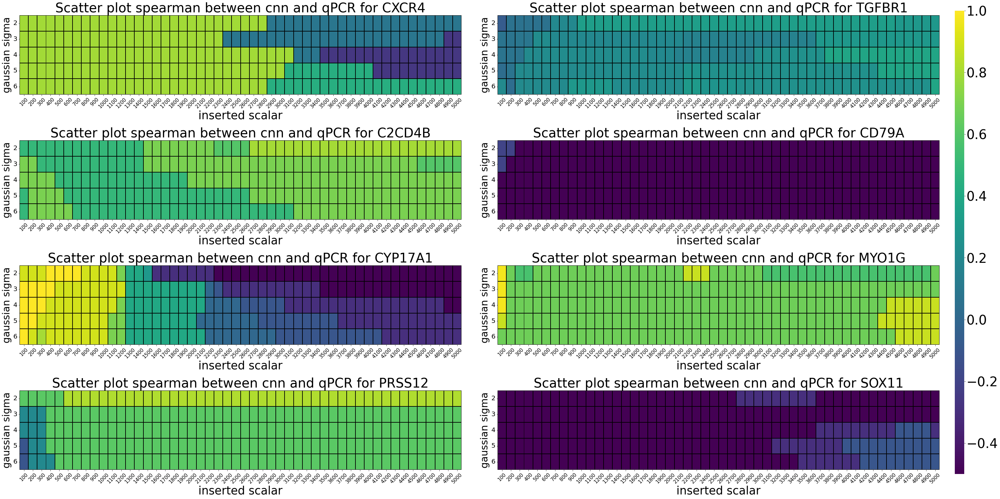

In [83]:
num_rows = 4
num_cols = 2
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(40, 20), sharey=False, sharex=False)
fig.tight_layout(pad=1, w_pad=8, h_pad=12)
cbar_ax = fig.add_axes([1.01, 0.01, .01, 0.99])
cbar_ax.tick_params(labelsize=40)

for transcript_index in range(len(transcript_list)):

    idx_x, idx_y = convert_to_2D(transcript_index, nrows=num_rows, ncols=num_cols)
#         print(idx, idx_x, idx_y)
    ax = axes[idx_x, idx_y]
    
    current_gene = transcript_list[transcript_index][1]

    for current_model_type in ['cnn']:

        current_results = []
        
#         seen = {}
        
        for e in results_list:
            gene = e[1]
            inserted_scalar = float(e[2])
            gaussian_sigma = float(e[3])
            model_type = e[4]
            sc = float(e[5])
            sp = float(e[6])
                
            if( (gene == current_gene) and (model_type == current_model_type) ):                
                
#                 # Correct bug leading to gaussian bandwidth being rounded to integer
#                 if( ((gaussian_bandwidth_uncorrected, inserted_p_value) in seen) or (gaussian_bandwidth_uncorrected >= 5) ):
#                     gaussian_bandwidth = gaussian_bandwidth_uncorrected + 0.11
#                 else:
#                     gaussian_bandwidth = gaussian_bandwidth_uncorrected + 0.61
#                 seen[(gaussian_bandwidth_uncorrected, inserted_p_value)] = 1                    
                
                current_results.append([int(inserted_scalar), int(gaussian_sigma), sc])
        
#                 if( ( (gaussian_bandwidth == 4.6) and (maximum_inserted_lnp1_minuslog10_p_value == 1.61) )
#                    or ( (gaussian_bandwidth == 1.1) and (maximum_inserted_lnp1_minuslog10_p_value == 1.61) ) ):
#                     print(gene, model_type, gaussian_bandwidth, maximum_inserted_lnp1_minuslog10_p_value, sc)
                
        current_df = pd.DataFrame(current_results, columns=["inserted_scalar", "gaussian_sigma", "scatter_spearman"])        

        current_df = current_df.set_index(["inserted_scalar", "gaussian_sigma"]).scatter_spearman.unstack(0)
        ax = sns.heatmap(current_df, ax=ax, cbar=(transcript_index == 0), cbar_ax=None if transcript_index else cbar_ax, vmin=-0.5, vmax=1, linewidths=1, linecolor="k", cmap=plt.cm.viridis)    

    #     plt.clim(0,1)
    #     plt.colorbar()

        ax.tick_params(axis='x', labelrotation=45, labelsize=15)
        ax.tick_params(axis='y', labelrotation=0, labelsize=20)
        ax.set_xlabel("inserted scalar", fontsize=35)
        ax.set_ylabel("gaussian sigma", fontsize=30)
        ax.set_title("Scatter plot spearman between " + current_model_type + " and qPCR for " + current_gene, fontsize=40)

plt.show()
plt.close()
        

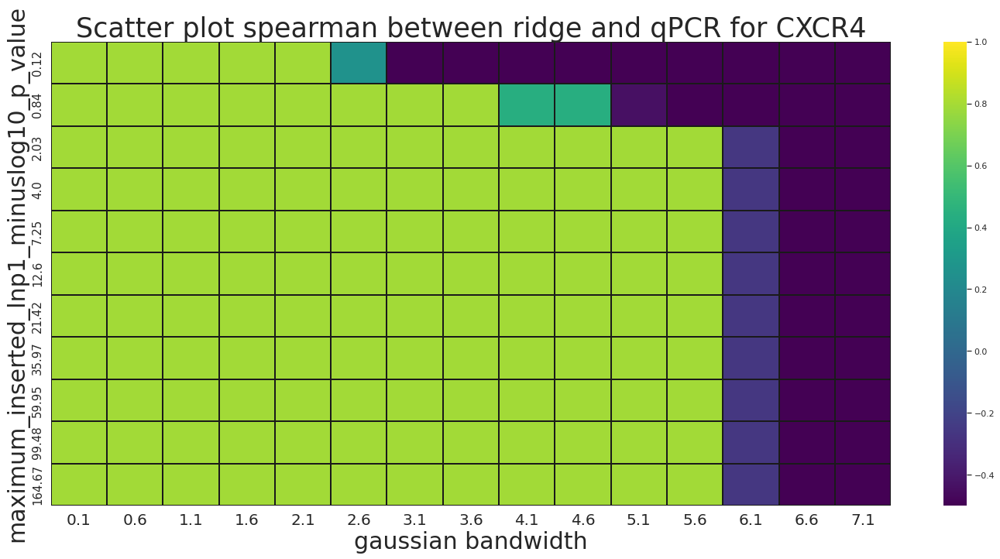

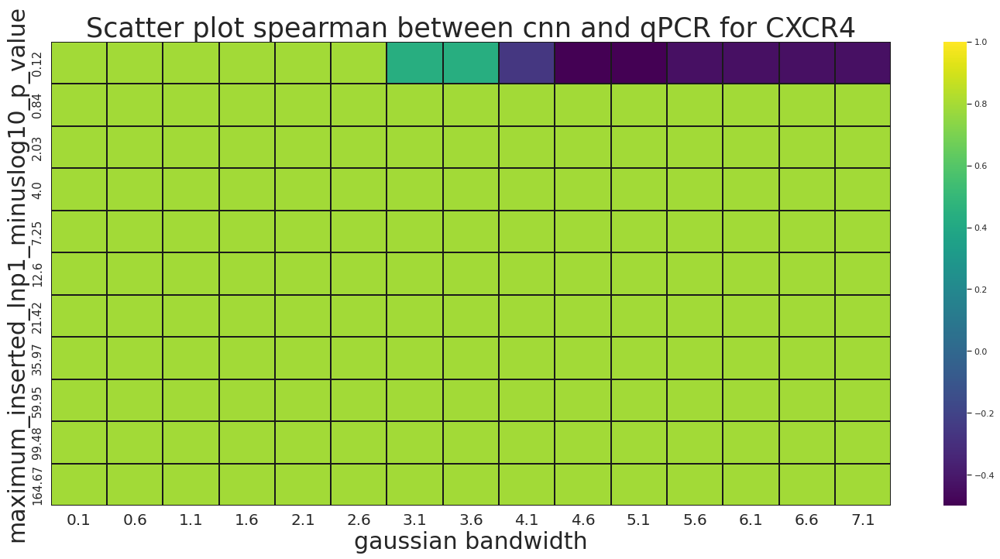

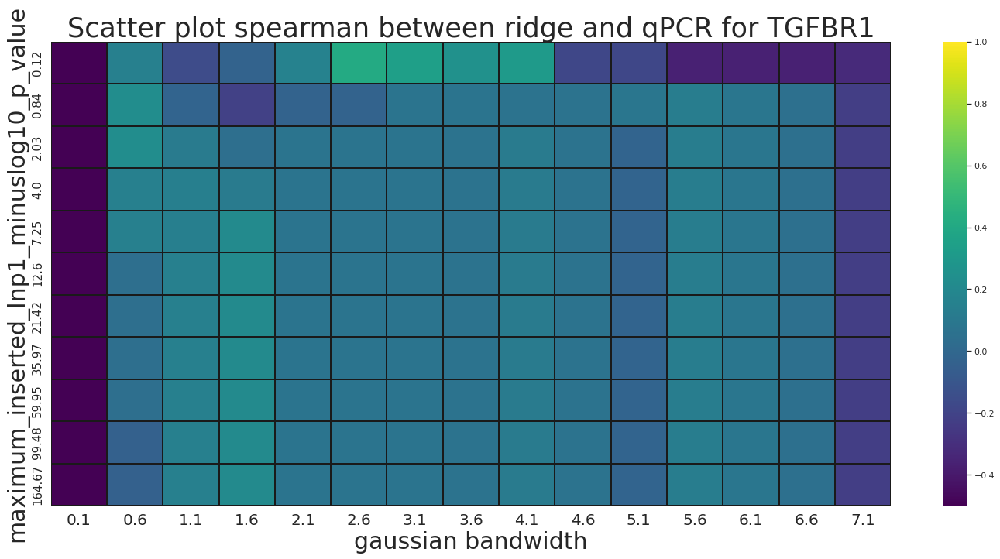

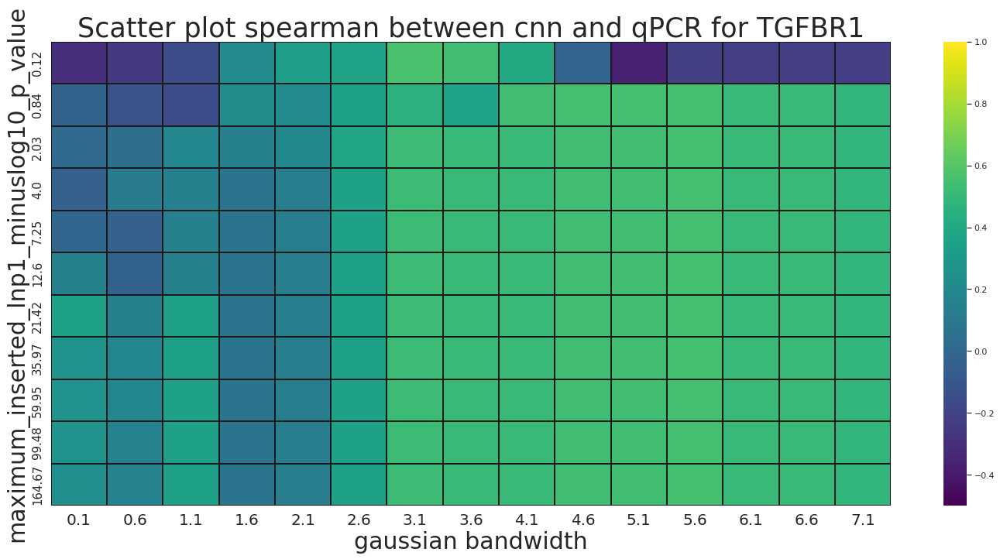

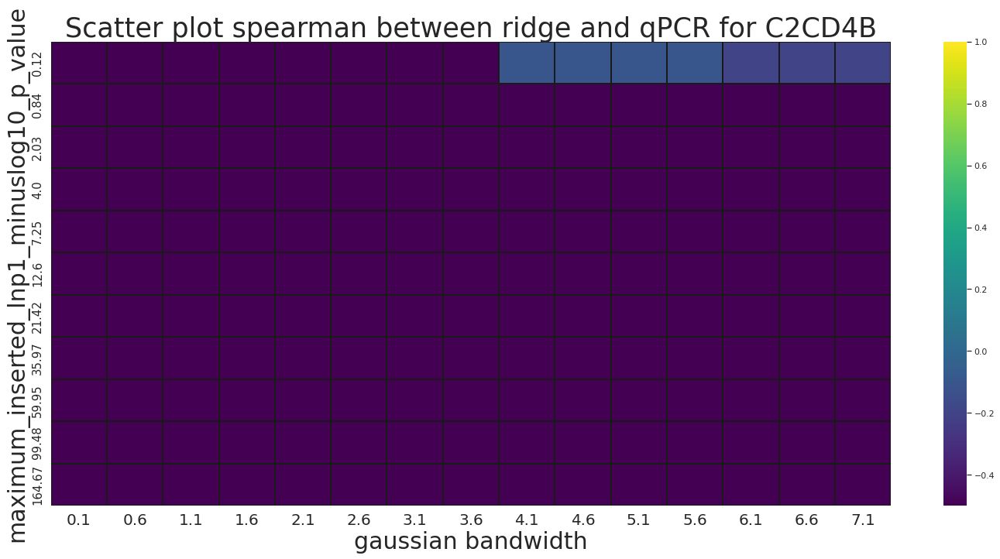

...

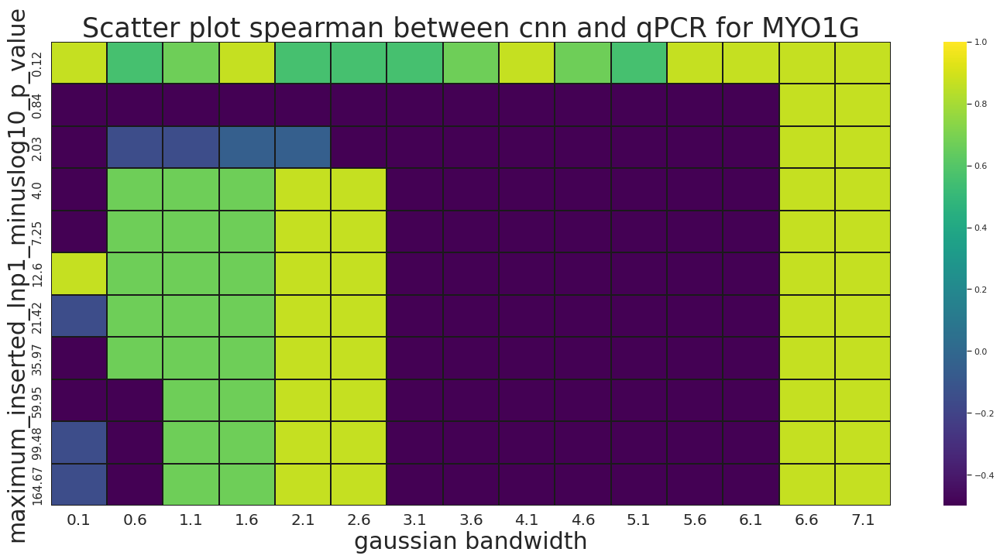

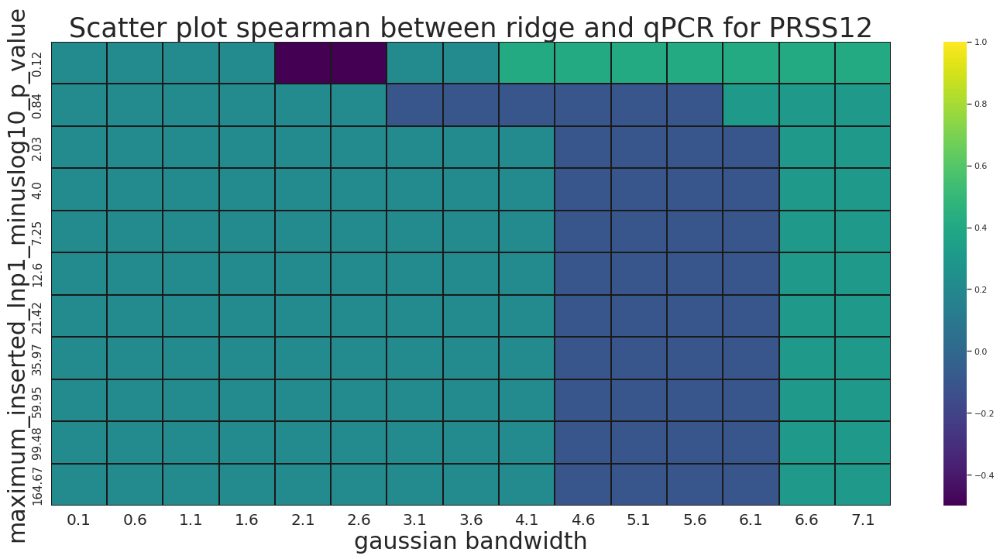

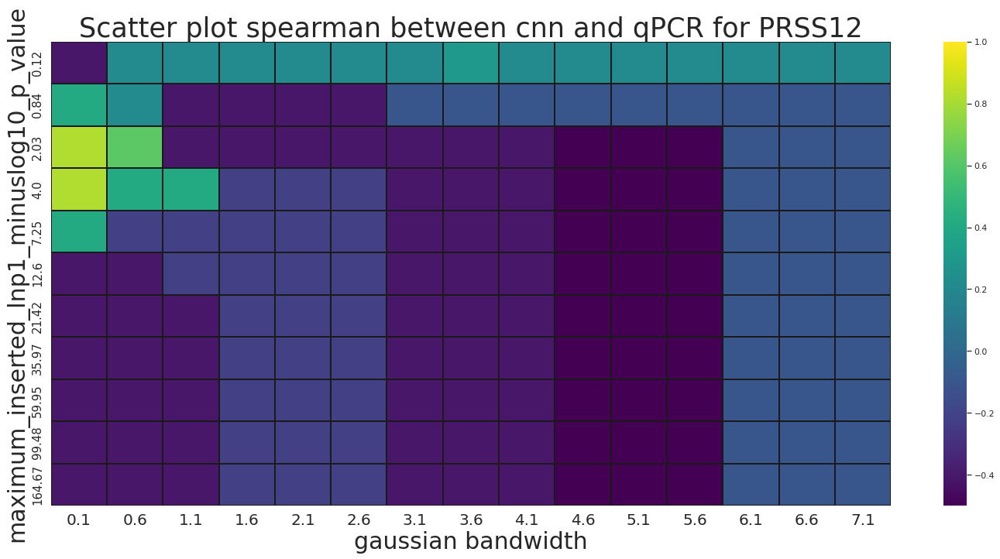

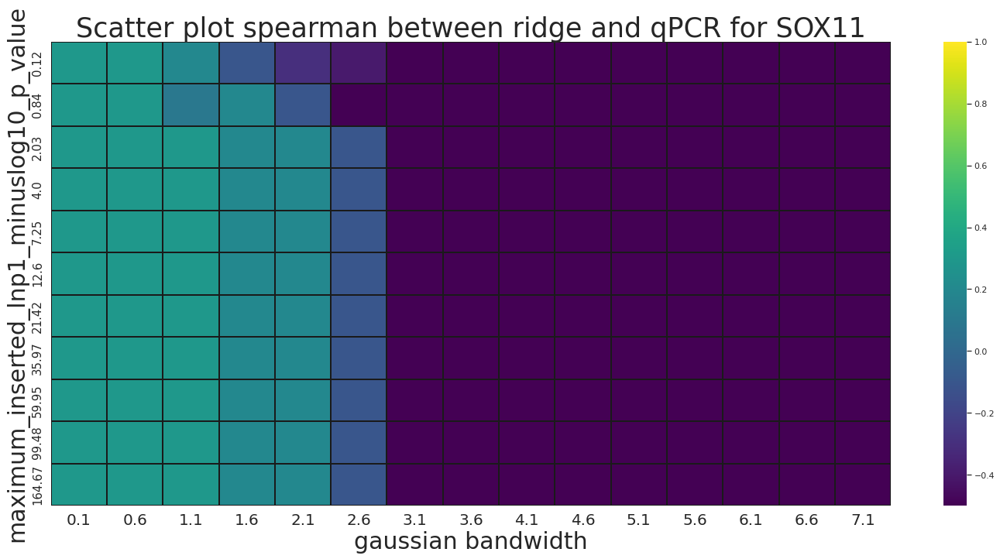

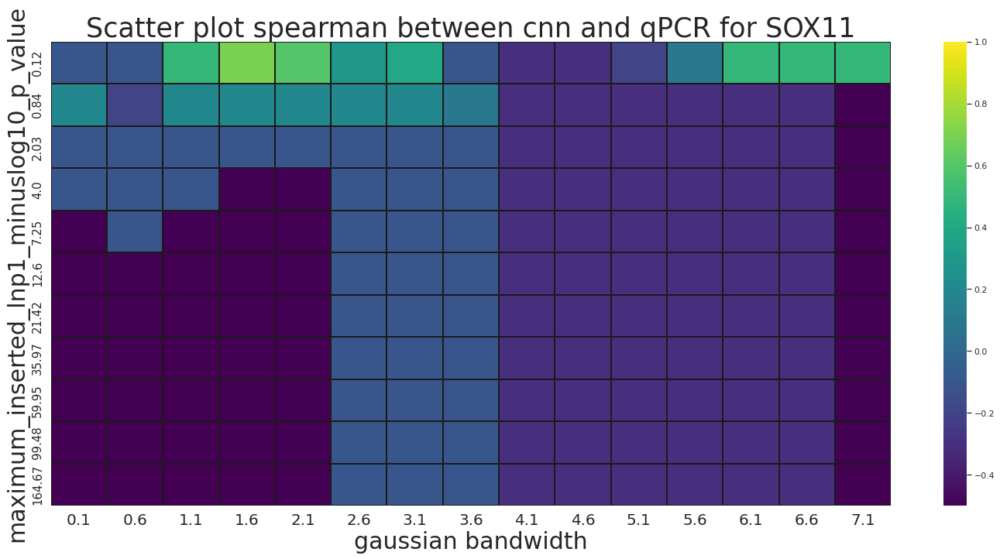

In [ ]:
# gaussian_results_list_1 

In [ ]:
# Visualize the epigenetic features for each gene in tandem with Alan's CRISPRa qPCR results
plt.rcParams["figure.figsize"] = (20, 10)
# plt.gca().set_prop_cycle(None)
colors = plt.cm.rainbow(np.linspace(0.0, 1.0, 3))

for i, t_pair in enumerate(transcript_list):

    fig,ax = plt.subplots()
    transcript = t_pair[0]
    gene = t_pair[1]

    epigenetic_features = np.expm1(np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(-1)+".npy"))
    TPM = (np.power(10, np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(-1)+".TPM.npy")) - 1)[0][0]    

    for j, assay_index in enumerate([6]):
        ax.plot([RESOLUTION * x for x in range(-ise_radius, ise_radius)], epigenetic_features[0, 200-ise_radius:200+ise_radius, assay_index], 'o-', color=colors[j], label=gene+"_"+assays[assay_index])

    ax2 = ax.twinx()
    for (t, gRNA, pos) in p300_dict[gene].keys():

        # If the gRNA_bin_wrt_TSS which is named pos, is not within the ise_radius, then ignore
        if(abs(pos) > ise_radius):
            print(ise_radius, pos, file=sys.stderr)
            continue

        if(t != transcript):
            continue
            
        fold_change_list = p300_dict[gene][(t, gRNA, pos)]
        mean_fold_change = np.mean(fold_change_list)
        stdev_fold_change = np.std(fold_change_list)
        
        ax2.errorbar(x=RESOLUTION * pos, y=mean_fold_change, marker='o', markersize=10, yerr=stdev_fold_change, color="k")

        
    ax.set_xlim((RESOLUTION + 1) * -ise_radius, (RESOLUTION + 1) * ise_radius)
    ax.grid(False)
    ax2.grid(False)
    ax.tick_params(axis='both', which='major', labelsize=20)
    ax2.tick_params(axis='both', which='major', labelsize=20)
#     ax.set_xticks(fontsize=20)
#     ax.set_yticks(fontsize=20)
    ax.set_xlabel("Position w.r.t TSS", fontsize=30)
    ax.set_ylabel("-log10(p-value)", fontsize=30)
    ax2.set_ylabel("qPCR fold-change", fontsize=30)
    ax.legend(loc="upper center", ncol=4, fontsize=30)
    plt.show()
    plt.close()

In [ ]:
# Compute the correlation across cell types, for each of the 8 genes, for both model types
for i, t_pair in enumerate(transcript_list):

    transcript = t_pair[0]
    gene = t_pair[1]

    for model_type in ["linear", "maxpool"]:

        for context_size in [401]: # list(num_layers_dict.keys())[16:]:
            half_window = context_size // 2

            num_layers = num_layers_dict[context_size]

            across_cell_type_spearman = []
                
            for replicate in range(1, 11):

                K.clear_session() # 2022 and what an insane bug in Keras! Time to switch to PyTorch
                trained_model = load_model("../../../Models/manuscript.R12.stochastic_chromosomes.replicate_"+str(replicate)+"_0_transcriptome_"+str(context_size)+"_"+str(num_layers)+"_32_"+str(model_type)+"_mse_1_-1.hdf5", compile=False)    
                
                l = []
                for cell_type in np.arange(-len(ALL_CELL_TYPES), 0):
    
                    epigenetic_features = np.expm1(np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(cell_type)+".npy"))
                    TPM = (np.power(10, np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(cell_type)+".TPM.npy")) - 1)[0][0]    
                
                    predicted_native_TPM = np.power(10, trained_model.predict(epigenetic_features[:, 200-half_window:200+half_window+1, :-1])[0][0]) -1 # Same reason for 200, as above
                    
                    l.append((TPM, predicted_native_TPM))

                across_cell_type_spearman.append(spearmanr([x[0] for x in l], [x[1] for x in l])[0])

            print(gene, model_type_rename_dict[model_type], round(np.mean(across_cell_type_spearman), 2), round(np.std(across_cell_type_spearman), 2))
        

100%|██████████| 10/10 [00:02<00:00,  3.52it/s]


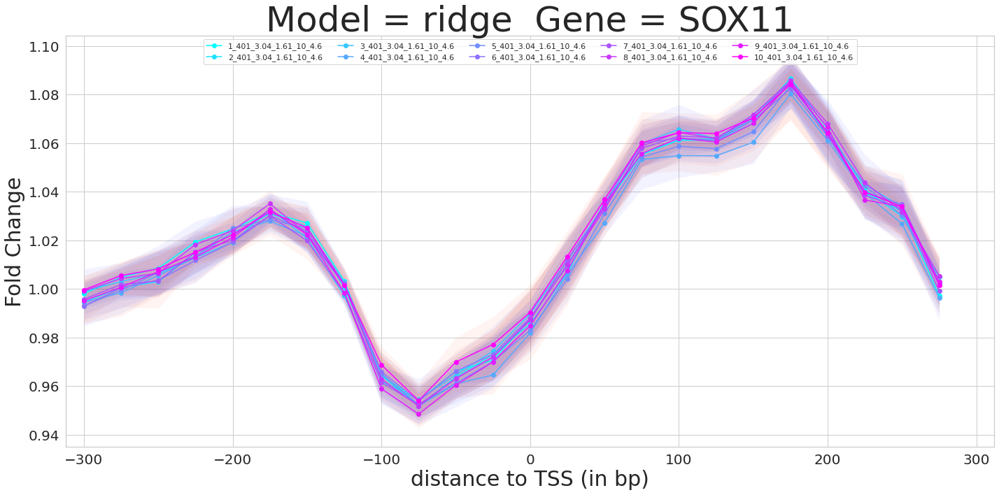

100%|██████████| 10/10 [00:10<00:00,  1.06s/it]


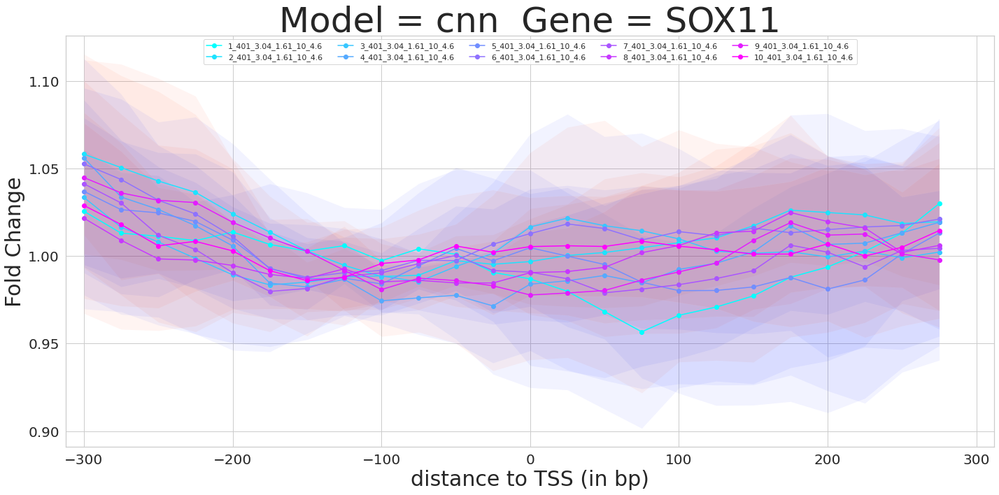

100%|██████████| 10/10 [00:02<00:00,  3.79it/s]


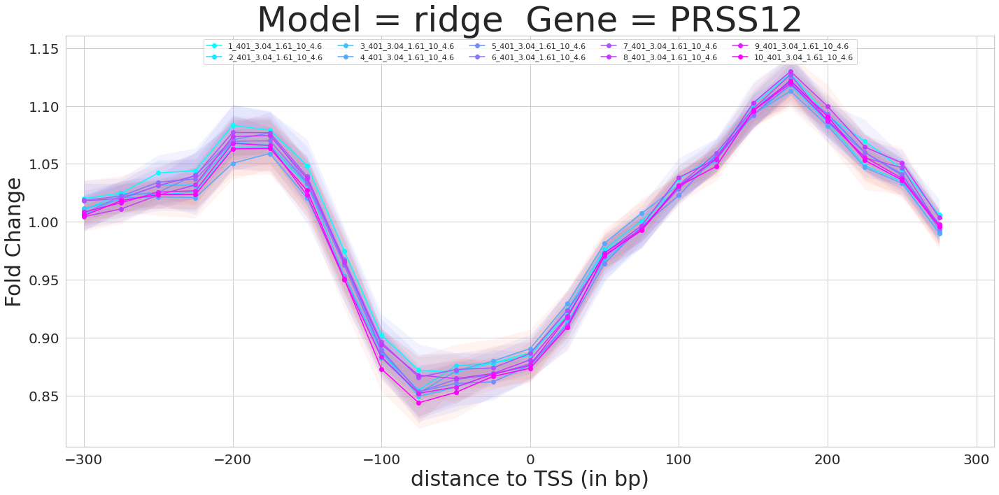

100%|██████████| 10/10 [00:10<00:00,  1.07s/it]


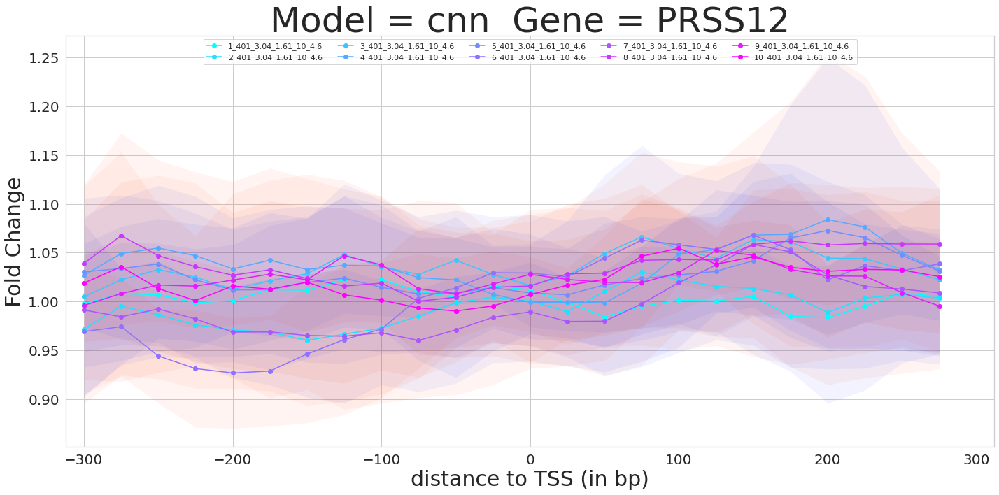

100%|██████████| 10/10 [00:02<00:00,  3.59it/s]


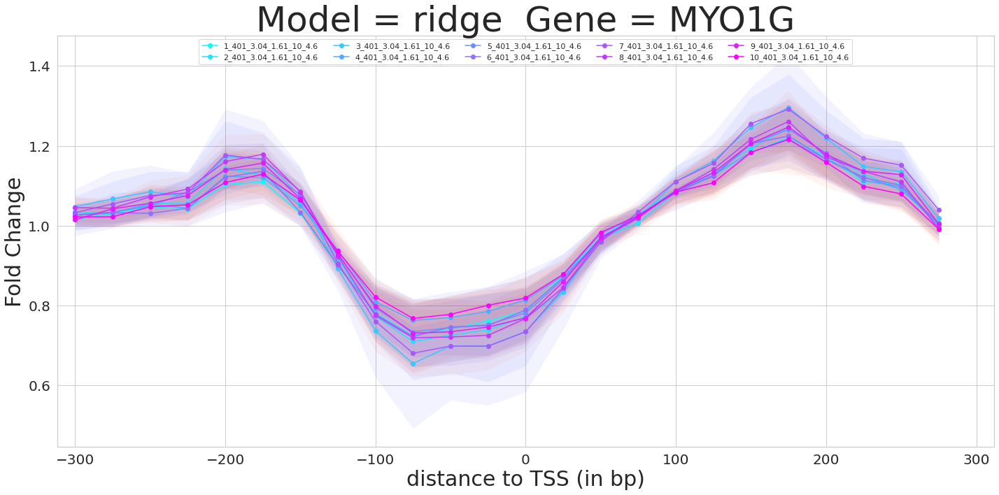

100%|██████████| 10/10 [00:10<00:00,  1.05s/it]


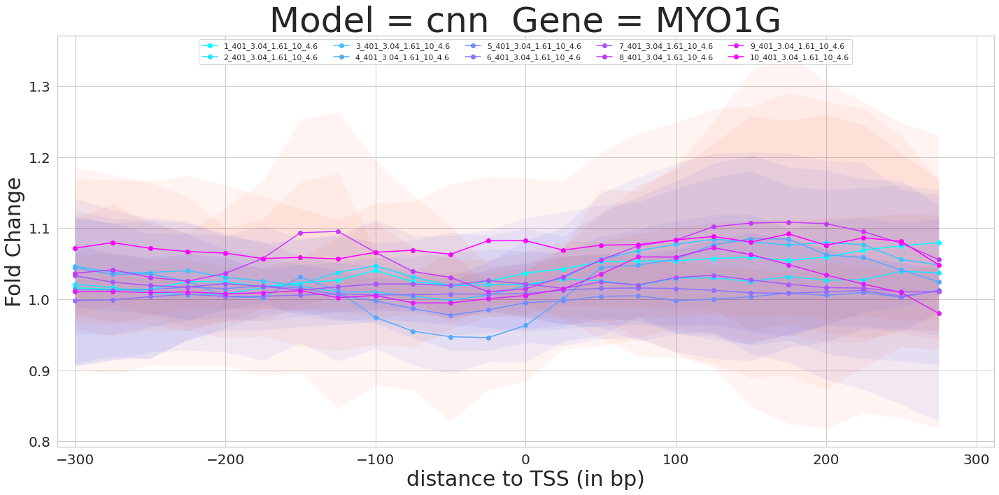

100%|██████████| 10/10 [00:02<00:00,  3.80it/s]


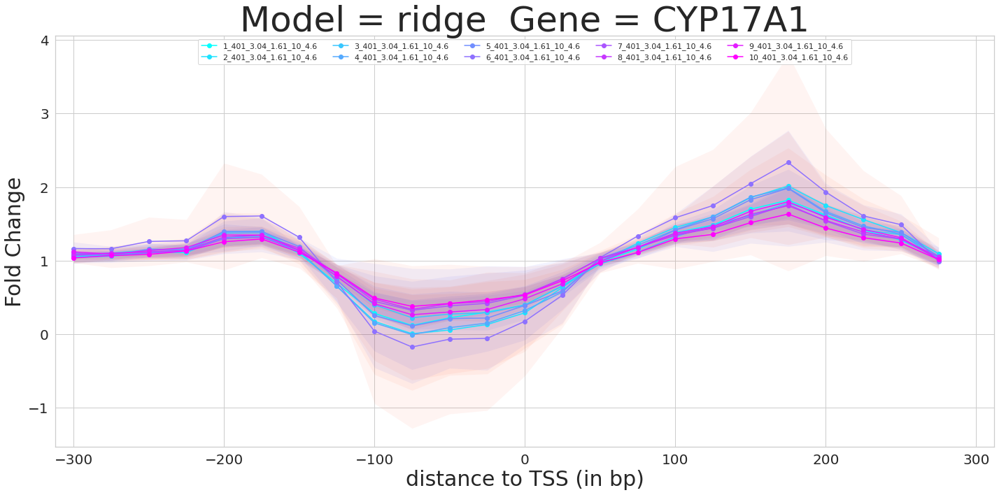

100%|██████████| 10/10 [00:10<00:00,  1.07s/it]


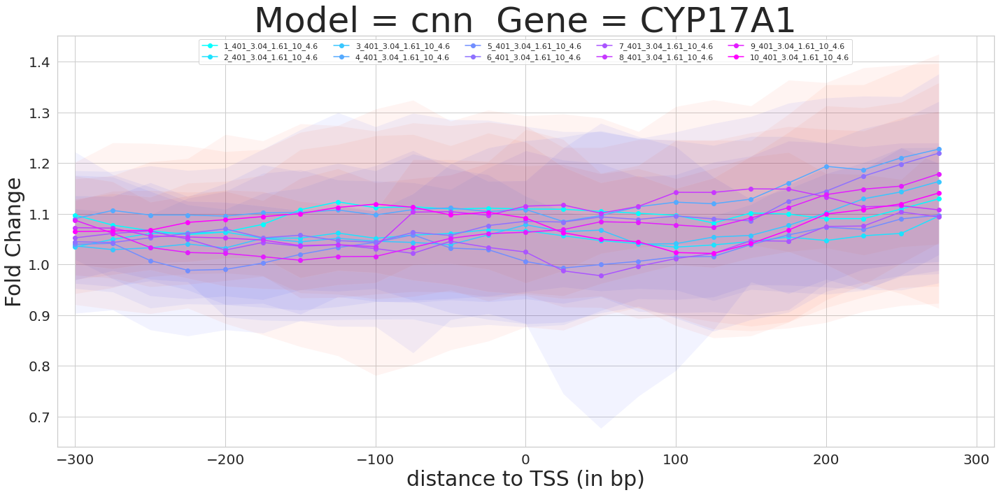

100%|██████████| 10/10 [00:02<00:00,  3.57it/s]


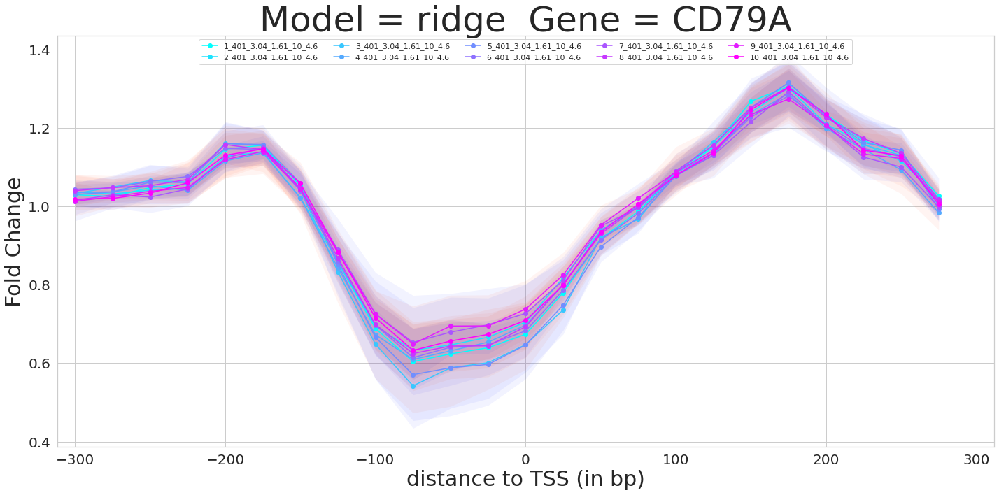

100%|██████████| 10/10 [00:10<00:00,  1.05s/it]


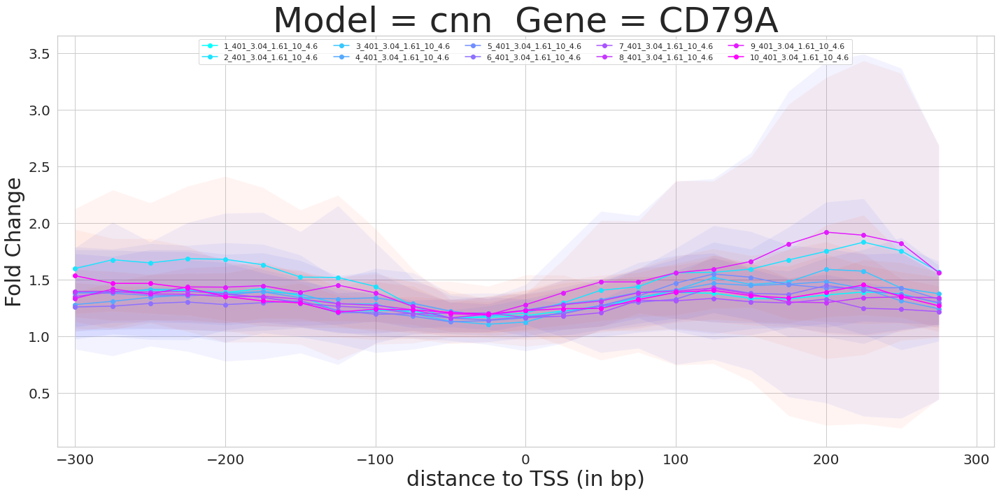

100%|██████████| 10/10 [00:02<00:00,  3.78it/s]


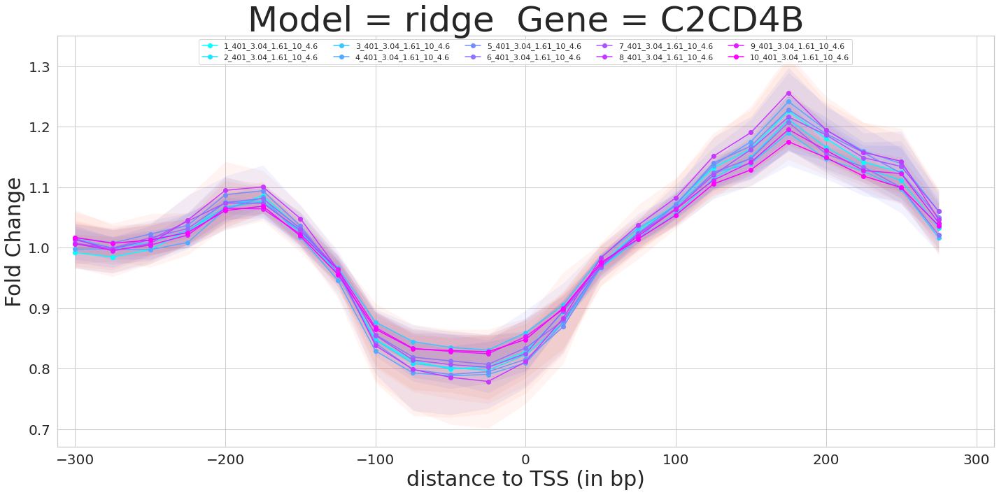

100%|██████████| 10/10 [00:10<00:00,  1.07s/it]


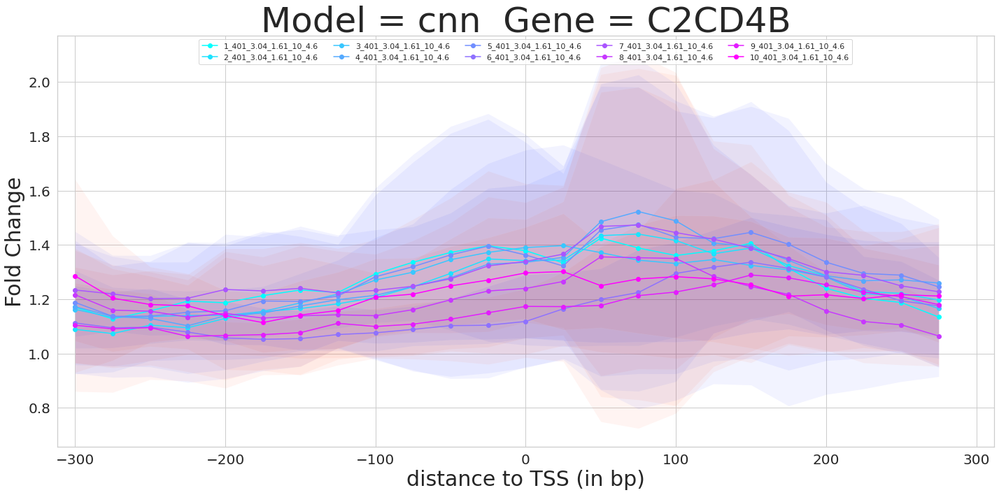

100%|██████████| 10/10 [00:02<00:00,  3.54it/s]


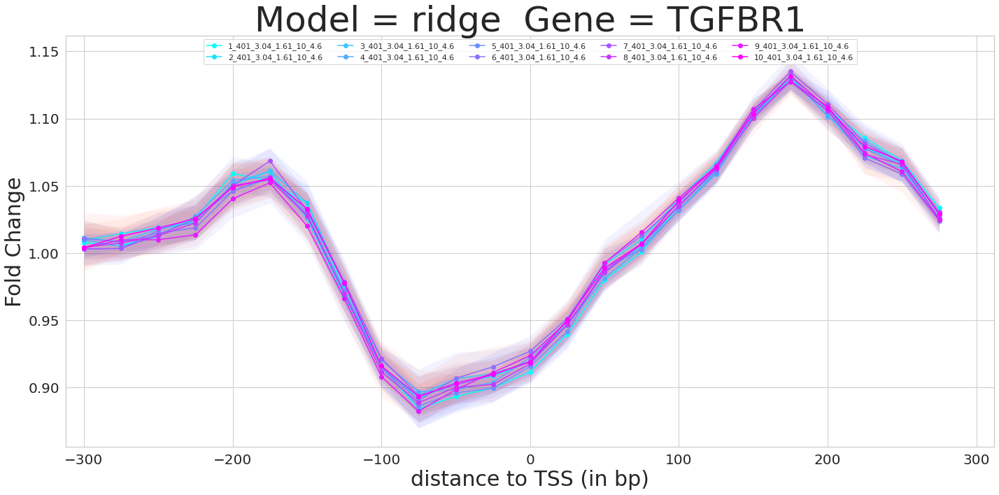

100%|██████████| 10/10 [00:10<00:00,  1.07s/it]


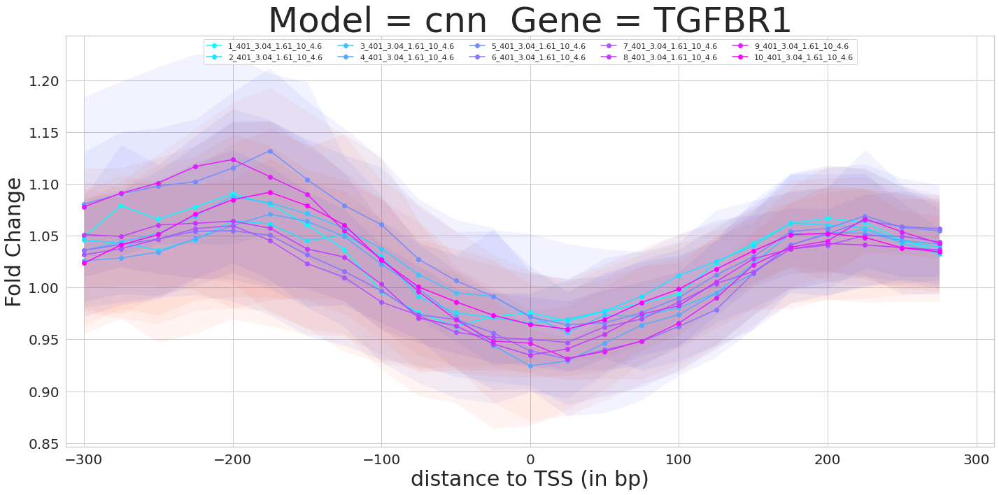

100%|██████████| 10/10 [00:02<00:00,  3.56it/s]


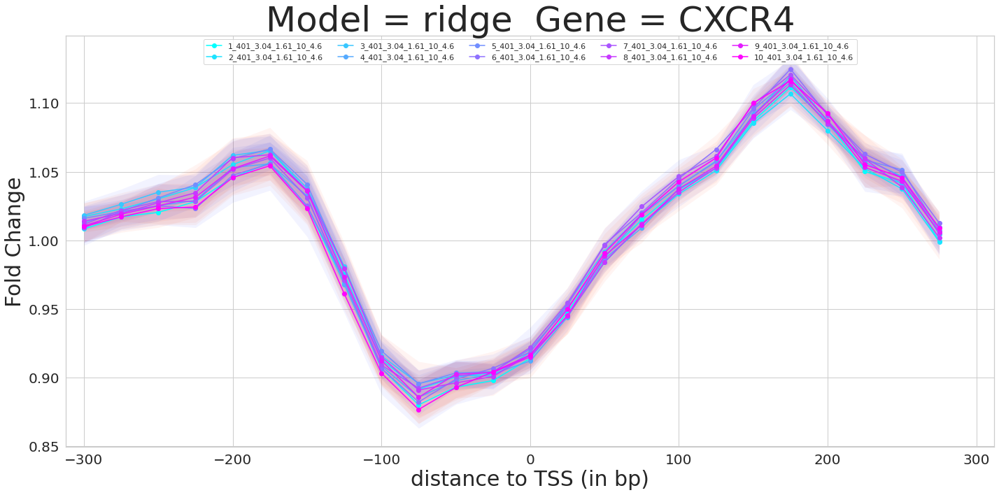

100%|██████████| 10/10 [00:10<00:00,  1.06s/it]


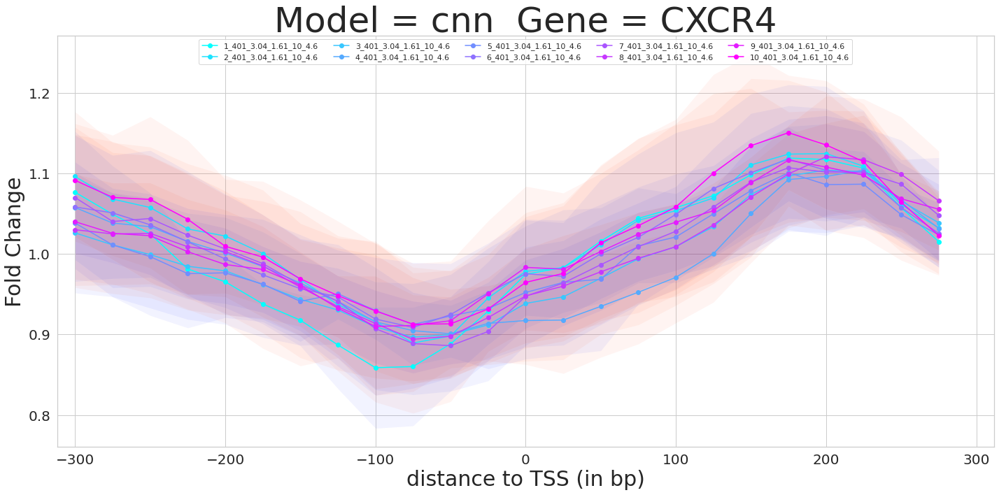

'                    \n            ise_mean_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)] = mean_fold_change_list\n            ise_stdev_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)] = stdev_fold_change_list\n\n            # Now we compare the model predictions w.r.t Alan\'s data\n\n            scatter_dict = {}                \n            scatter_dict[gene] = {}\n            scatter_dict[gene][model_type_rename_dict[model_type]] = []\n\n            max_fold_change = 1\n\n            for (transcript, gRNA, pos) in p300_dict[gene].keys():\n\n                # If the gRNA_bin_wrt_TSS which is named pos, is not within the ise_radius, then ignore\n                if(abs(pos) > ise_radius):\n                    print(ise_radius, pos, file=sys.stderr)\n                    continue\n\n                fold_change_list = p300_dict[gene][(transcript, gRNA, pos)]\n                mean_fold_change = np.mean(fold_change_list)\n                std

In [47]:
# Compute in silico perturbation plots for 100 replicate models
# We create a pipeline to predict the correlation with Alan's data (near the TSS within +-250bp)
# And analyze if we can overfit to what the perturbation should be like?

from tensorflow.keras.models import load_model
import sys
sys.path.insert(1, '../../../Code/deepENCODE/')
from chrmt_inference import perturb_x
from tensorflow.keras import backend as K


# Set plotting parameters
plt.rcParams["figure.figsize"] = (20, 10)
plt.gca().set_prop_cycle(None)
colors = plt.cm.cool(np.linspace(0.0, 1.0, 10))

# Initialize some dicts
transcript_list = [("ENST00000241393.3", "CXCR4"),
                   ("ENST00000374994.8", "TGFBR1"),
                   ("ENST00000380392.3", "C2CD4B"),
                   ("ENST00000221972.7", "CD79A"),
                   ("ENST00000369887.3", "CYP17A1"),
                   ("ENST00000258787.11", "MYO1G"),
                   ("ENST00000296498.3", "PRSS12"),
                   ("ENST00000322002.4", "SOX11")]

num_layers_dict = {9:2, 13:2, 17:2, 21:2, 25:2,
                   31:3, 41:3, 51:3, 61:3, 71:3,
                   81:4, 101:4, 121:4, 141:4, 161:4, 181:4, 201:4, 221:4, 241:4,
                   261:5, 281:5, 301:5, 321:5, 341:5, 361:5, 381:5, 401:5}

ise_mean_fold_change_dict = {}
ise_stdev_fold_change_dict = {}

results_list = []

# Then, for a particular transcript, we compute the ISE scores mean-ed across many models and compare with Alan's data
for transcript_index in np.arange(len(transcript_list)-1, -1, -1):

    inserted_peak_width = 10
    inserted_lnp1_minuslog10_p_value = 3.04 # ln(x+1) = 3.04  => x+1 => 21 => x == -log10(p-value) = 20
    maximum_inserted_lnp1_minuslog10_p_value = 1.61 # np.arange(0.11, 5.12, 0.5)  
    gaussian_bandwidth = 4.6 # np.arange(0.1, 7.11, +0.5)
    stranded_MNase_offset = 0

    ise_radius = 12
    bin_wrt_tss_choices = list(range(-ise_radius, ise_radius)) # region where we perform ISE
    
    for t_pair in [transcript_list[transcript_index]]:

        transcript = t_pair[0]
        gene = t_pair[1]

        epigenetic_features = np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(-1)+".npy")
        TPM = (np.power(10, np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(-1)+".TPM.npy")) - 1)[0][0]    
#             print(epigenetic_features.shape, TPM)

        for model_type in ["linear", "maxpool"]:

            for replicate_set in range(1, 11):

                context_size = 401
                half_window = context_size // 2

                num_layers = num_layers_dict[context_size]

                fold_change_dict = {}

                for replicate in tqdm(np.random.choice(range(1, 101), 10, replace=False)):

                    K.clear_session() # 2022 and what an insane bug in Keras! Time to switch to PyTorch
                    
                    key = (replicate_set, model_type, transcript)
                    
                    # R13 => 100 replicates trained on all epigenetic tracks
                    # R14 => same but with other epigenetic tracks set to 0
                    trained_model = load_model("../../../Models/manuscript.R13.stochastic_chromosomes.replicate_"+str(replicate)+"_0_transcriptome_"+str(context_size)+"_"+str(num_layers)+"_32_"+str(model_type)+"_mse_1_-1.hdf5", compile=False)    

                    fold_change_list = []

                    for bin_wrt_tss in bin_wrt_tss_choices:
                        perturbed_epigenetic_features = perturb_x(epigenetic_features, bin_wrt_tss, inserted_peak_width, inserted_lnp1_minuslog10_p_value, stranded_MNase_offset, maximum_inserted_lnp1_minuslog10_p_value, gaussian_bandwidth)
                        predicted_log10p1_TPM = trained_model.predict(perturbed_epigenetic_features[:, 200-half_window:200+half_window+1, :-1]) # This is 200 because of the size of the loaded epigenetic features numpy array
                        predicted_TPM = (np.power(10, predicted_log10p1_TPM) - 1)[0][0]
                        predicted_native_TPM = np.power(10, trained_model.predict(epigenetic_features[:, 200-half_window:200+half_window+1, :-1])[0][0]) -1 # Same reason for 200, as above
                        fold_change_list.append(predicted_TPM / predicted_native_TPM)

                    if(key in fold_change_dict):
                        fold_change_dict[key].append(fold_change_list)
                    else:
                        fold_change_dict[key] = [fold_change_list]

                mean_fold_change_list = np.mean(fold_change_dict[key], axis=0)
                stdev_fold_change_list = np.std(fold_change_dict[key], axis=0)

                y_lower = [x[0] - x[1] for x in list(zip(mean_fold_change_list, stdev_fold_change_list))]
                y_upper = [x[0] + x[1] for x in list(zip(mean_fold_change_list, stdev_fold_change_list))]

                plt.plot([RESOLUTION * x for x in bin_wrt_tss_choices], mean_fold_change_list, 'o-', color=colors[replicate_set-1],
                          label=str(replicate_set)+"_"+str(context_size)+"_"+str(inserted_lnp1_minuslog10_p_value)+"_"+str(maximum_inserted_lnp1_minuslog10_p_value)+"_"+str(inserted_peak_width)+"_"+str(gaussian_bandwidth))
                plt.fill_between([RESOLUTION * x for x in bin_wrt_tss_choices], y_lower, y_upper, alpha = 0.05, label='')

            plt.xlim((RESOLUTION + 1) * -ise_radius, (RESOLUTION + 1) * ise_radius)
#             plt.ylim(0.5, 1.5)

            plt.xticks(fontsize=20)
            plt.yticks(fontsize=20)    
            plt.ylabel("Fold Change", fontsize=30)
            plt.xlabel("distance to TSS (in bp)", fontsize=30)

            plt.legend(loc="upper center", ncol=5)
            plt.title("Model = " + str(model_type_rename_dict[model_type]) + "  Gene = " + str(gene), fontsize=50)
            plt.show()
            plt.close()
                 
                    
'''                    
            ise_mean_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)] = mean_fold_change_list
            ise_stdev_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)] = stdev_fold_change_list

            # Now we compare the model predictions w.r.t Alan's data

            scatter_dict = {}                
            scatter_dict[gene] = {}
            scatter_dict[gene][model_type_rename_dict[model_type]] = []

            max_fold_change = 1

            for (transcript, gRNA, pos) in p300_dict[gene].keys():

                # If the gRNA_bin_wrt_TSS which is named pos, is not within the ise_radius, then ignore
                if(abs(pos) > ise_radius):
                    print(ise_radius, pos, file=sys.stderr)
                    continue

                fold_change_list = p300_dict[gene][(transcript, gRNA, pos)]
                mean_fold_change = np.mean(fold_change_list)
                stdev_fold_change = np.std(fold_change_list)

#                         plt.errorbar(x=RESOLUTION * pos, y=mean_fold_change, marker='o', markersize=10, yerr=stdev_fold_change, color="k")

                if(mean_fold_change > max_fold_change):
                    max_fold_change = mean_fold_change

                scatter_dict[gene][model_type_rename_dict[model_type]].append((mean_fold_change, ise_mean_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)][ise_radius + pos]))

            # Then we overlay with the predictions from the models by creating a scatter plot and computing spearman
            model_type_color_dict = {"linear":"red", "maxpool":"blue"}
            mean_predictions = ise_mean_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)]
            stdev_predictions = ise_stdev_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)]

#                 plt.errorbar(x=[RESOLUTION * x for x in range(-ise_radius, ise_radius)], y=[1.8 * x * max_fold_change for x in mean_predictions], yerr=[0.1 * x * max_fold_change for x in stdev_predictions], marker='o', color=model_type_color_dict[model_type], label=model_type_rename_dict[model_type])

            # Plot epigenetic features instead of model predictions
            # Load epigenetic features in HEK293T
#                 epigenetic_features = np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(-1)+".npy")
#                 print(epigenetic_features.shape)
#                 assay_index = 2
#                 plt.plot([RESOLUTION * x for x in range(-ise_radius, ise_radius)], [1 * x * max_fold_change for x in epigenetic_features[0, 200-ise_radius:200+ise_radius, assay_index]], 'o-', label=assays[assay_index])

#                 plt.xlim((RESOLUTION + 1) * -ise_radius, (RESOLUTION + 1) * ise_radius)
#                 plt.yticks(fontsize=20)
#                 plt.title(gene + " " + transcript)
#                 plt.legend(loc="upper right", fontsize=40)
#                 plt.show()
#                 plt.close()

            scatter_x = [x[0] for x in scatter_dict[gene][model_type_rename_dict[model_type]]]
            scatter_y = [x[1] for x in scatter_dict[gene][model_type_rename_dict[model_type]]]

#                     plt.scatter(scatter_x, scatter_y, s=100)

            sc, sp = spearmanr(scatter_x, scatter_y)
            results_list.append([transcript, gene, round(key[0], 4), round(key[1], 4), model_type_rename_dict[model_type], round(sc, 2), round(sp, 2)])
#                     print(results_list)

#                     plt.title(gene + " " + str(round(sc, 2)) + " " + str(round(sp, 2)), fontsize=50)
#                     plt.show()
#                     plt.close()

'''




100%|██████████| 10/10 [00:02<00:00,  3.83it/s]


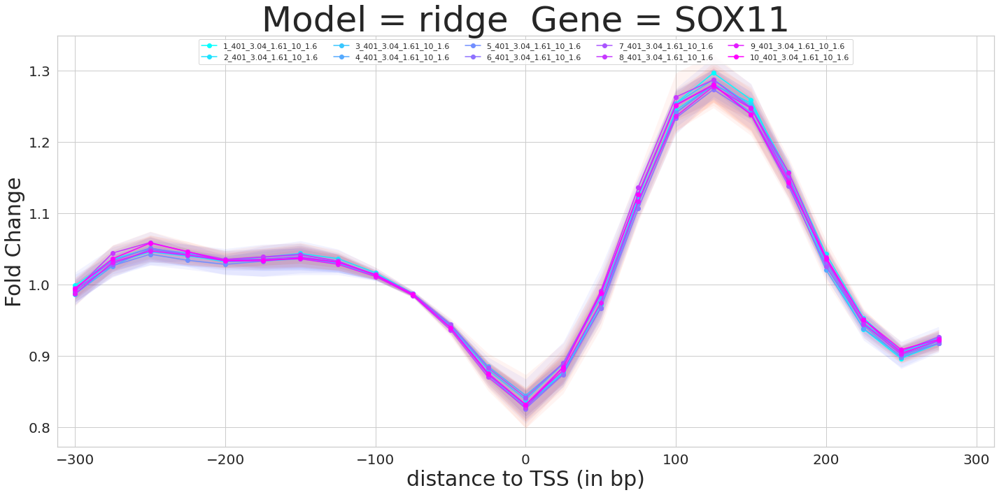

100%|██████████| 10/10 [00:10<00:00,  1.05s/it]


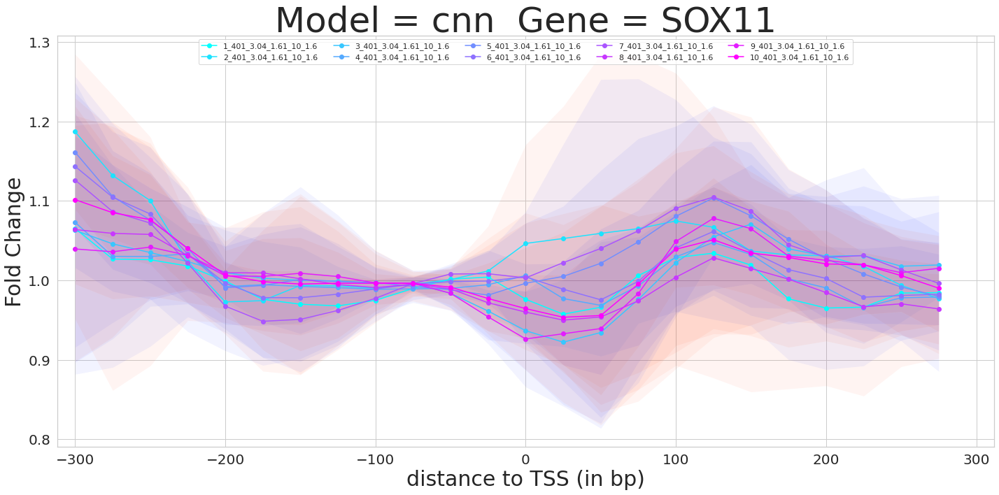

100%|██████████| 10/10 [00:02<00:00,  3.84it/s]


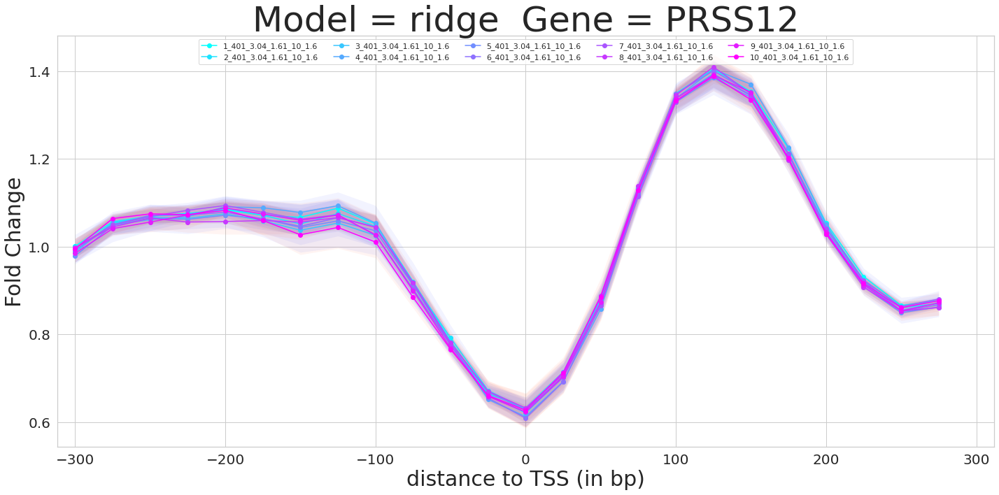

100%|██████████| 10/10 [00:10<00:00,  1.05s/it]


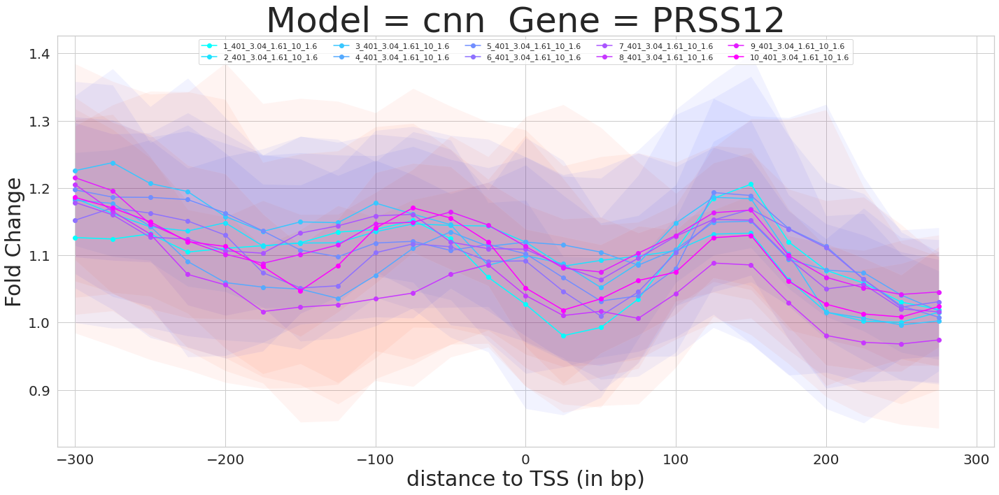

100%|██████████| 10/10 [00:02<00:00,  3.63it/s]


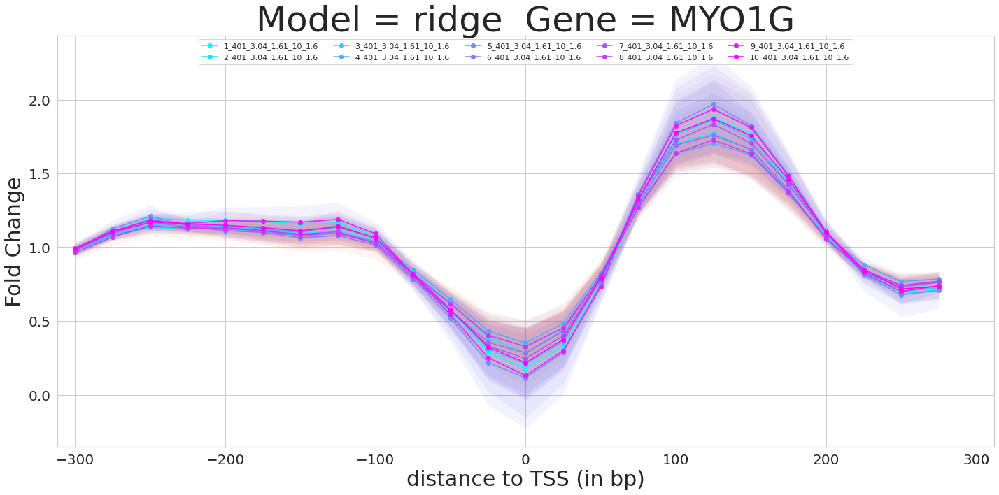

100%|██████████| 10/10 [00:10<00:00,  1.07s/it]


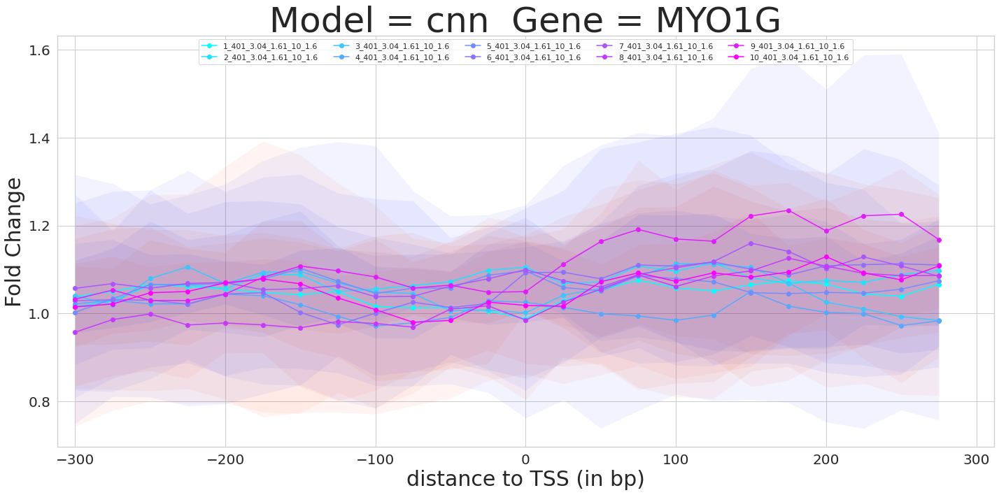

100%|██████████| 10/10 [00:02<00:00,  3.81it/s]


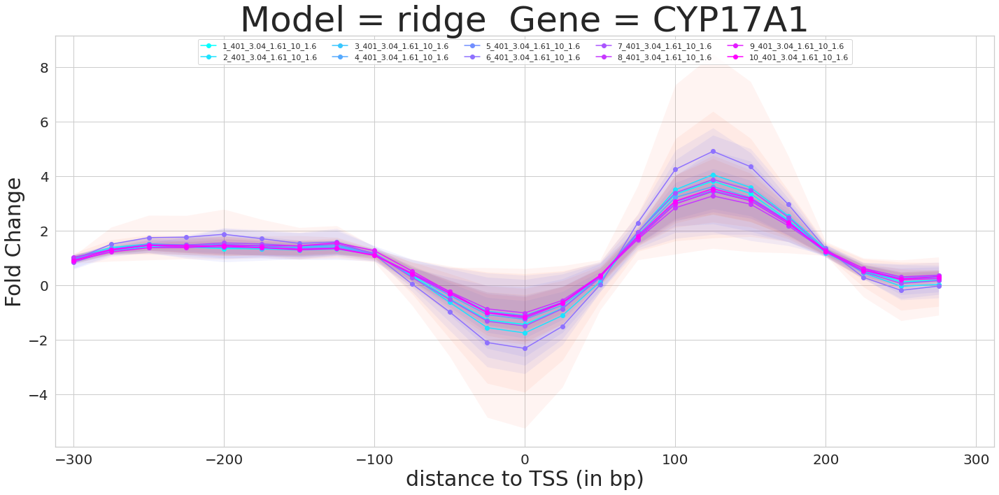

100%|██████████| 10/10 [00:10<00:00,  1.05s/it]


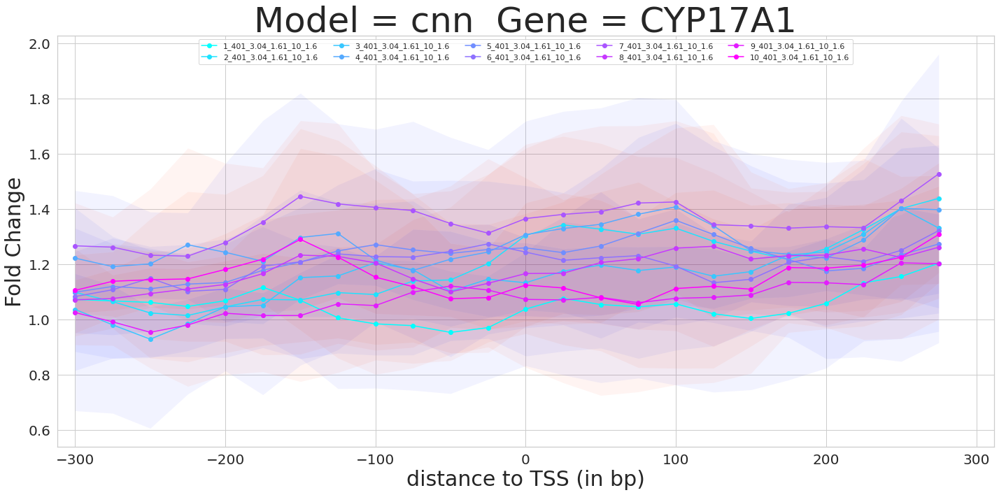

100%|██████████| 10/10 [00:02<00:00,  3.82it/s]


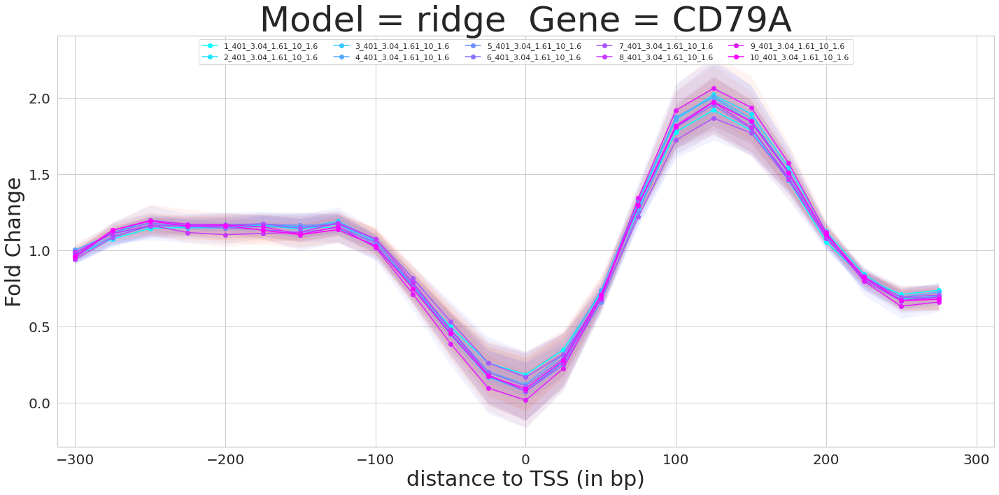

100%|██████████| 10/10 [00:10<00:00,  1.08s/it]


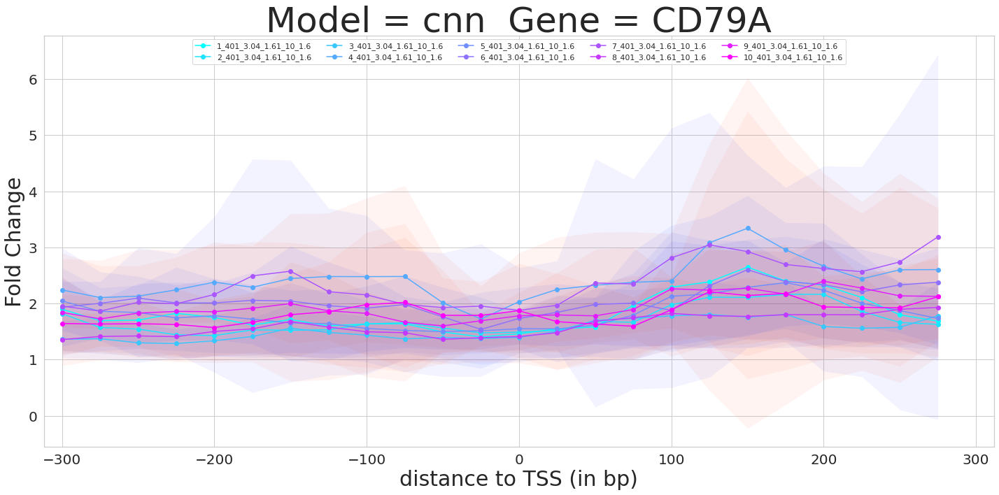

100%|██████████| 10/10 [00:02<00:00,  3.83it/s]


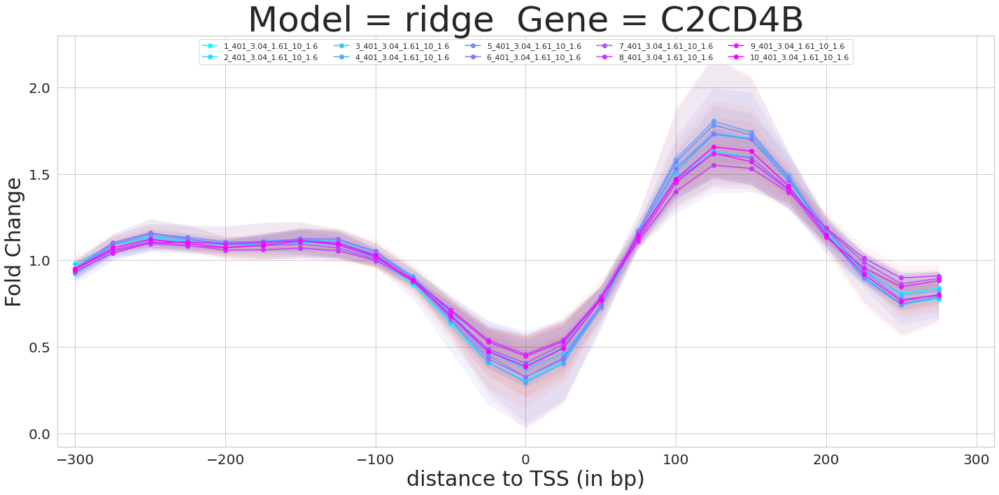

100%|██████████| 10/10 [00:10<00:00,  1.06s/it]


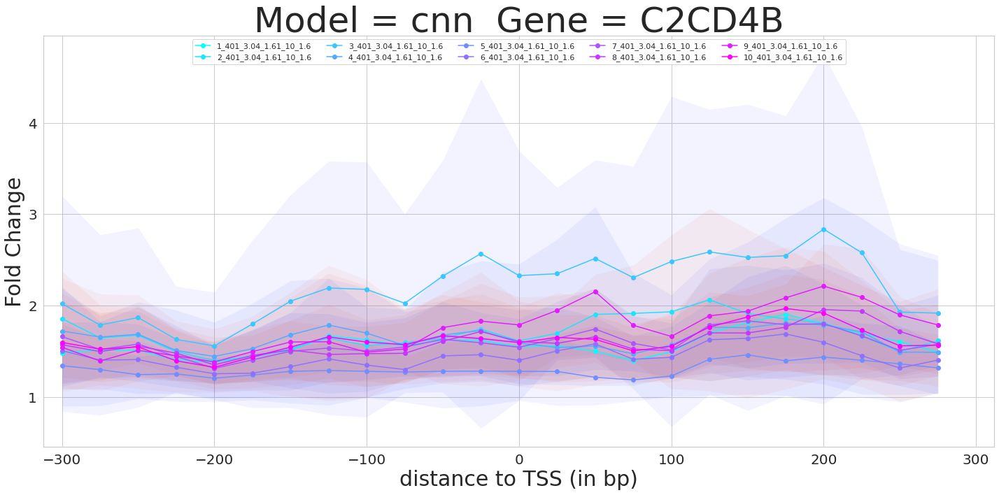

100%|██████████| 10/10 [00:02<00:00,  3.83it/s]


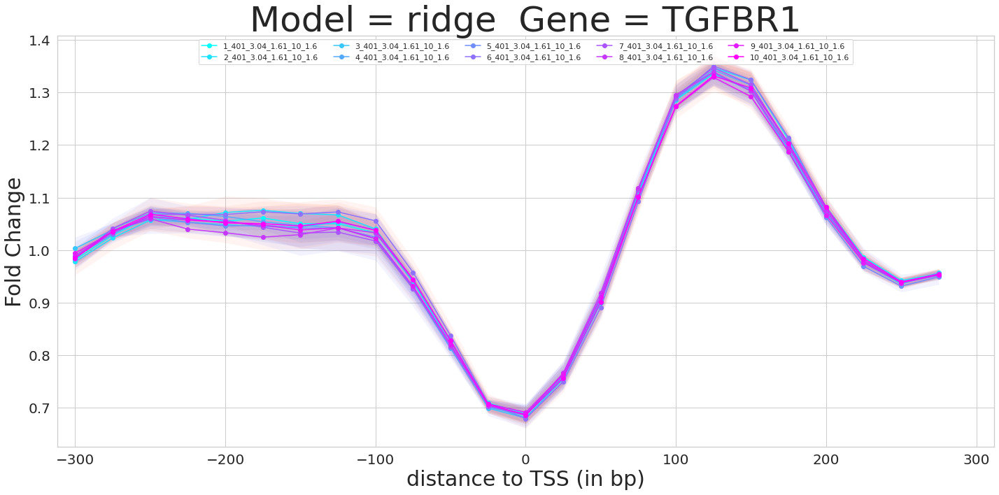

100%|██████████| 10/10 [00:10<00:00,  1.07s/it]


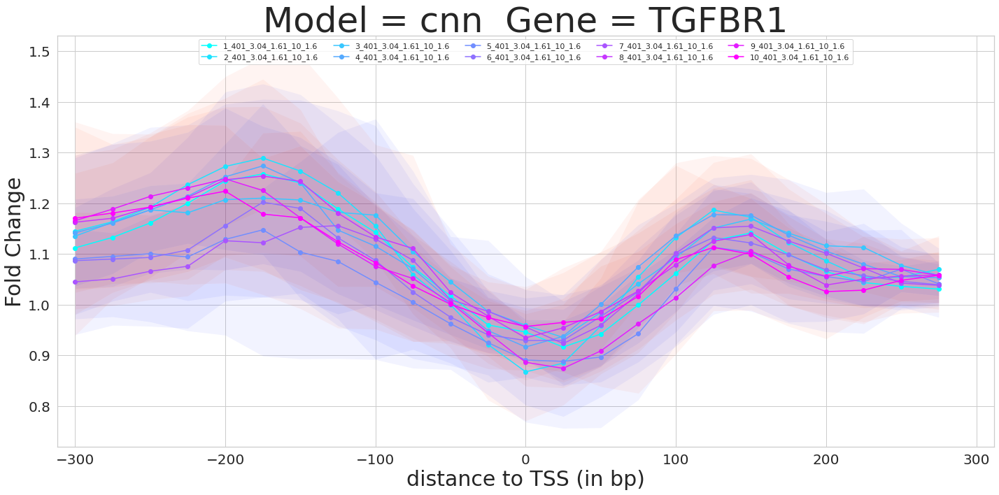

100%|██████████| 10/10 [00:02<00:00,  3.82it/s]


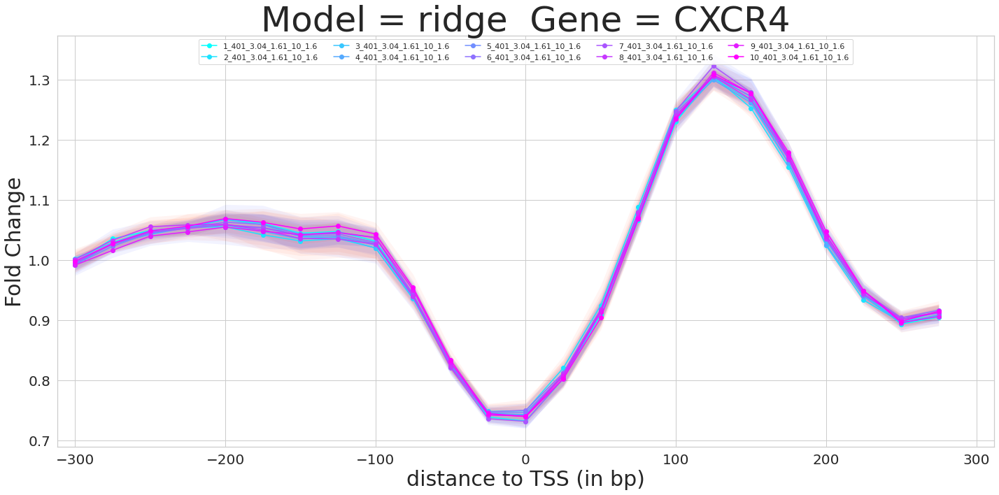

100%|██████████| 10/10 [00:10<00:00,  1.05s/it]


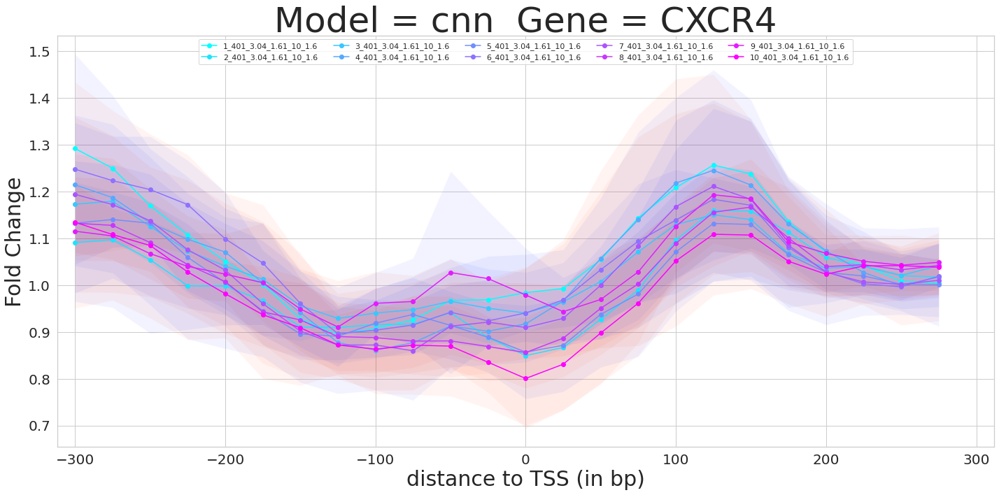

'                    \n            ise_mean_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)] = mean_fold_change_list\n            ise_stdev_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)] = stdev_fold_change_list\n\n            # Now we compare the model predictions w.r.t Alan\'s data\n\n            scatter_dict = {}                \n            scatter_dict[gene] = {}\n            scatter_dict[gene][model_type_rename_dict[model_type]] = []\n\n            max_fold_change = 1\n\n            for (transcript, gRNA, pos) in p300_dict[gene].keys():\n\n                # If the gRNA_bin_wrt_TSS which is named pos, is not within the ise_radius, then ignore\n                if(abs(pos) > ise_radius):\n                    print(ise_radius, pos, file=sys.stderr)\n                    continue\n\n                fold_change_list = p300_dict[gene][(transcript, gRNA, pos)]\n                mean_fold_change = np.mean(fold_change_list)\n                std

In [40]:
# gaussian_bandwidth = 1.6

In [ ]:
# Compute CRISPRa-bility by comparing:
# 1) a model trained on all the epigenetic tracks 
# 2) a model trained on all the epigenetic tracks with all except H3K27ac set to 0

for i, t_pair in enumerate(transcript_list):

    transcript = t_pair[0]
    gene = t_pair[1]

    for model_type in ["linear", "maxpool"]:

        across_cell_type_spearman = []

        for replicate_set in range(10):

            context_size = 401
            half_window = context_size // 2
            num_layers = num_layers_dict[context_size]

            l_predicted = []

            for replicate in [x + (10 * replicate_set) for x in range(1, 11)]:
            
                K.clear_session() # 2022 and what an insane bug in Keras! Time to switch to PyTorch
                trained_model = load_model("../../../Models/manuscript.R13.stochastic_chromosomes.replicate_"+str(replicate)+"_0_transcriptome_"+str(context_size)+"_"+str(num_layers)+"_32_"+str(model_type)+"_mse_1_-1.hdf5", compile=False)    

                l_true = []
                
                for cell_type in np.arange(-len(ALL_CELL_TYPES), 0):

                    epigenetic_features = np.expm1(np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(cell_type)+".npy"))
                    TPM = (np.power(10, np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(cell_type)+".TPM.npy")) - 1)[0][0]    
                
#                     # Set other epigenetic tracks to 0 for CRISPRa-bility
#                     epigenetic_features[:, :, np.r_[0,1,3,4,5]] = 0
                    
                    predicted_native_TPM = np.power(10, trained_model.predict(epigenetic_features[:, 200-half_window:200+half_window+1, :-1])[0][0]) -1 # Same reason for 200, as above

                    l_true.append(TPM)
                    l_predicted.append(predicted_native_TPM)

            # Take the mean of every len(ALL_CELL_TYPES) entry in l_predicted before computing spearman
            l_predicted_mean = []
            for ct in range(len(ALL_CELL_TYPES)):
                l_predicted_mean.append(np.mean(l_predicted[ct::len(ALL_CELL_TYPES)]))
            
            across_cell_type_spearman.append(spearmanr([x for x in l_true], [x for x in l_predicted_mean])[0])

        print(gene, model_type_rename_dict[model_type], round(np.mean(across_cell_type_spearman), 2), round(np.std(across_cell_type_spearman), 2))

In [46]:
# Training with all epigenetic tracks        

CXCR4 ridge 0.66 0.02
CXCR4 cnn 0.64 0.04
TGFBR1 ridge 0.14 0.03
TGFBR1 cnn 0.23 0.06
C2CD4B ridge 0.5 0.02
C2CD4B cnn 0.49 0.1
CD79A ridge 0.26 0.06
CD79A cnn 0.24 0.07
CYP17A1 ridge 0.73 0.06
CYP17A1 cnn 0.56 0.08
MYO1G ridge 0.17 0.05
MYO1G cnn 0.35 0.15
PRSS12 ridge 0.79 0.0
PRSS12 cnn 0.9 0.01
SOX11 ridge 0.84 0.02
SOX11 cnn 0.9 0.01


In [45]:
# Training with only H3K27ac with other epigenetic tracks 0-ed out        

CXCR4 ridge 0.77 0.01
CXCR4 cnn 0.83 0.02
TGFBR1 ridge -0.06 0.03
TGFBR1 cnn 0.19 0.06
C2CD4B ridge 0.67 0.01
C2CD4B cnn 0.44 0.03
CD79A ridge 0.09 0.03
CD79A cnn 0.3 0.04
CYP17A1 ridge 0.43 0.03
CYP17A1 cnn 0.08 0.02
MYO1G ridge 0.42 0.03
MYO1G cnn 0.59 0.05
PRSS12 ridge 0.84 0.0
PRSS12 cnn 0.76 0.01
SOX11 ridge 0.77 0.01
SOX11 cnn 0.79 0.02


In [43]:
# CRISPRability cnn spearman delta
CYP17A1: 0.48
PRSS12: 0.14
SOX11: 0.11    
C2CD4B: 0.05
TGFBR1: 0.04
CD79A: -0.06
CXCR4: -0.19
MYO1G: -0.24
    
# CRISPRability ridge spearman delta    
CYP17A1: 0.3
PRSS12: -0.05
SOX11: 0.07
C2CD4B: -0.17
TGFBR1: 0.2
CD79A: 0.17
CXCR4: -0.11
MYO1G: -0.25


In [ ]:
# Add variance across 